In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "5"

In [1]:
from memflow.read_data.dataset_all import DatasetCombined
from memflow.unfolding_network.conditional_transformer import ConditioningTransformerLayer
from memflow.unfolding_flow.utils import *
from memflow.unfolding_flow.mmd_loss import MMD

import numpy as np
import scipy.stats as st
import torch
from torch import optim
from torch.utils.data import DataLoader
import torch.nn as nn
from torch.nn.functional import normalize
from torch.optim.lr_scheduler import CosineAnnealingLR

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib as mpl
from matplotlib import cm

from tensorboardX import SummaryWriter
from omegaconf import OmegaConf
import sys
import argparse
import os
from pynvml import *
from hist import Hist
import hist
import vector
import mplhep
import awkward as ak

from memflow.read_data.utils import to_flat_tensor
from memflow.phasespace.phasespace import PhaseSpace

from utils import FindMasks
from utils import SavePlots
from utils import plot_regressionFactor

pi = torch.pi

torch.set_num_threads(10)

In [2]:
batchSize = 1024
path_data = '/work/dvalsecc/MEM/datasets/all_jets_fullRun2_ttHbb_forTraining_allyears_spanetprov_part2.parquet'
device = torch.device("cuda") if torch.cuda.is_available() else torch.device('cpu')

#model_dir= "/work/dvalsecc/MEM/models_archive/flow_pretraining_spanet_reweighted/preTraining_results_pretraining_weighted_spanet_v3_noProv:True_cartesian:False_HuberLoss:True_latent_space:True_hiddenFeatures:32_dimFeedForward:512_nheadEnc:4_LayersEnc:4_nheadDec:4_LayersDec:4"
model_dir= '/work/dvalsecc/MEM/models_archive/flow_pretraining_spanet/preTraining_spanet_v2_noProv:True_cartesian:False_HuberLoss:True_latent_space:True_hiddenFeatures:64_dimFeedForward:1024_nheadEnc:4_LayersEnc:6_nheadDec:4_LayersDec:4/'
path_unscaled = model_dir + '/unscaledRegressedPartonsTensor.pt'
path_to_conf = model_dir + '/config_spanet_v2.yaml'
#path_to_conf = model_dir + '/config_pretraining_weighted_spanet_v3.yaml'
model_path = model_dir + '/model_spanet_v2.pt'
#model_path = model_dir + '/model_pretraining_weighted_spanet_v3.pt'
with open(path_to_conf) as f:
        conf = OmegaConf.load(path_to_conf)

log_mean = torch.tensor(conf.scaling_params.log_mean, device=device)
log_std = torch.tensor(conf.scaling_params.log_std, device=device)

In [3]:
model = ConditioningTransformerLayer(no_jets = conf.input_shape.number_jets,
                                    no_lept = conf.input_shape.number_lept,
                                    input_features=conf.input_shape.input_features, 
                                    hidden_features=conf.conditioning_transformer.hidden_features,
                                    dim_feedforward_transformer= conf.conditioning_transformer.dim_feedforward_transformer,
                                    out_features=conf.conditioning_transformer.out_features,
                                    nhead_encoder=conf.conditioning_transformer.nhead_encoder,
                                    no_layers_encoder=conf.conditioning_transformer.no_layers_encoder,
                                    nhead_decoder=conf.conditioning_transformer.nhead_decoder,
                                    no_layers_decoder=conf.conditioning_transformer.no_layers_decoder,
                                    no_decoders=conf.conditioning_transformer.no_decoders,
                                    aggregate=conf.conditioning_transformer.aggregate,
                                    use_latent=conf.conditioning_transformer.use_latent,
                                    out_features_latent=conf.conditioning_transformer.out_features_latent,
                                    no_layers_decoder_latent=conf.conditioning_transformer.no_layers_decoder_latent,   
                                    dtype=torch.float64)

In [4]:
data = DatasetCombined(path_data, dev=device, dtype=torch.float64,
                        reco_list=['scaledLogRecoParticles', 'mask_lepton', 
                                            'mask_jets','mask_met',
                                            'mask_boost', 'data_boost'],
                        parton_list=["logScaled_data_higgs_t_tbar_ISR"], build=False)

dataCorrect = data.parton_data.data_higgs_t_tbar_ISR_cartesian

higgsCorrect = vector.array(
    {
        "E": dataCorrect[:,0,0].detach().numpy(),
        "px": dataCorrect[:,0,1].detach().numpy(),
        "py": dataCorrect[:,0,2].detach().numpy(),
        "pz": dataCorrect[:,0,3].detach().numpy(),
    }
)

thadCorrect = vector.array(
    {
        "E": dataCorrect[:,1,0].detach().numpy(),
        "px": dataCorrect[:,1,1].detach().numpy(),
        "py": dataCorrect[:,1,2].detach().numpy(),
        "pz": dataCorrect[:,1,3].detach().numpy(),
    }
)

tlepCorrect = vector.array(
    {
        "E": dataCorrect[:,2,0].detach().numpy(),
        "px": dataCorrect[:,2,1].detach().numpy(),
        "py": dataCorrect[:,2,2].detach().numpy(),
        "pz": dataCorrect[:,2,3].detach().numpy(),
    }
)

glISRCorrect = vector.array(
    {
        "E": dataCorrect[:,3,0].detach().numpy(),
        "px": dataCorrect[:,3,1].detach().numpy(),
        "py": dataCorrect[:,3,2].detach().numpy(),
        "pz": dataCorrect[:,3,3].detach().numpy(),
    }
)

higgsCorrect = ak.with_name(higgsCorrect, name="Momentum4D")
thadCorrect = ak.with_name(thadCorrect, name="Momentum4D")
tlepCorrect = ak.with_name(tlepCorrect, name="Momentum4D")
glISRCorrect = ak.with_name(glISRCorrect, name="Momentum4D")


RecoLevel
Badsedir:  /work/dvalsecc/MEM/datasets/all_jets_fullRun2_ttHbb_forTraining_allyears_spanetprov_part2
Reading reco_level Files
Load scaledLogRecoParticles

PartonLevel
Reading parton_level Files
Load logScaled_data_higgs_t_tbar_ISR



# Apply the model on the fly

In [7]:
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict['model_state_dict'])
model.eval()
model = model.to(device)

In [8]:
batch_size = 1024
data_loader = DataLoader(dataset=data, shuffle=False, batch_size=batch_size)

In [9]:
N = 100

In [10]:
hdata = torch.zeros(batch_size*N, 3).to(device)
t1data = torch.zeros(batch_size*N, 3).to(device)
t2data = torch.zeros(batch_size*N, 3).to(device)

In [11]:
hdata.shape

torch.Size([102400, 3])

In [12]:
for i, dd in enumerate(data_loader):
    #print(i)
    if i> N-1: break
    (logScaled_reco, 
     mask_lepton_reco,
     mask_jets, mask_met, 
     mask_boost_reco, data_boost_reco) = dd
       
    mask_recoParticles = torch.cat((mask_jets, mask_lepton_reco, mask_met), dim=1)
    
    # remove prov
    if (conf.noProv):
        logScaled_reco = logScaled_reco[:,:,:-1]
    
    #print(mask_recoParticles.shape)
    #print(logScaled_reco.shape)
    
    out = model(logScaled_reco, data_boost_reco, mask_recoParticles, mask_boost_reco)
    hdata[i*batch_size: (i+1)*batch_size] = out[0]
    t1data[i*batch_size: (i+1)*batch_size] = out[1]
    t2data[i*batch_size: (i+1)*batch_size] = out[2]

OutOfMemoryError: CUDA out of memory. Tried to allocate 76.00 MiB (GPU 0; 10.92 GiB total capacity; 10.10 GiB already allocated; 31.44 MiB free; 10.33 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [22]:
particle=0
out_unscaled_log = hdata*log_std + log_mean
out_unscaled = out_unscaled_log.clone()
out_unscaled[:,0] = torch.sign(out_unscaled_log[:,0])*(torch.exp(torch.abs(out_unscaled_log[:,0])) - 1)

In [23]:
out_unscaled.shape

torch.Size([6400, 3])

(array([  0.,   0.,   0.,   0.,   3.,   4.,  12.,  15.,  25.,  29.,  41.,
         57.,  76.,  95.,  97., 123., 148., 181., 236., 253., 279., 356.,
        340., 374., 389., 411., 416., 386., 310., 295., 296., 247., 189.,
        150., 121., 110.,  82.,  72.,  47.,  38.,  29.,  36.,  18.,   8.,
          6.,   0.,   0.,   0.,   0.,   0.]),
 array([-4.  , -3.84, -3.68, -3.52, -3.36, -3.2 , -3.04, -2.88, -2.72,
        -2.56, -2.4 , -2.24, -2.08, -1.92, -1.76, -1.6 , -1.44, -1.28,
        -1.12, -0.96, -0.8 , -0.64, -0.48, -0.32, -0.16,  0.  ,  0.16,
         0.32,  0.48,  0.64,  0.8 ,  0.96,  1.12,  1.28,  1.44,  1.6 ,
         1.76,  1.92,  2.08,  2.24,  2.4 ,  2.56,  2.72,  2.88,  3.04,
         3.2 ,  3.36,  3.52,  3.68,  3.84,  4.  ]),
 [<matplotlib.patches.Polygon at 0x7f39cb019d00>])

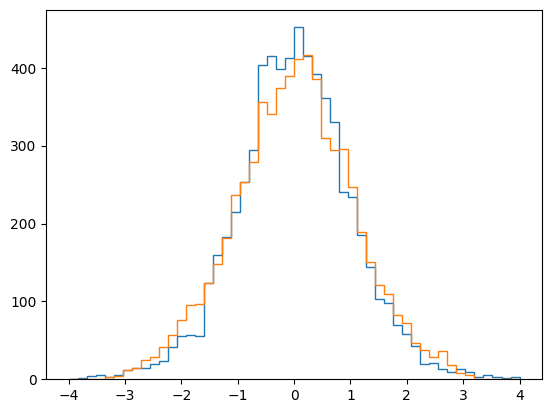

In [24]:
plt.hist(higgsCorrect.eta[0:6400],
         bins=50, histtype="step", range=(-4,4))
plt.hist(out_unscaled[:,1].detach().numpy(),
         bins=50, histtype="step", range=(-4,4))
                          

(array([  0.,  31., 203., 241., 308., 410., 380., 433., 391., 384., 365.,
        309., 314., 258., 215., 185., 213., 171., 135., 161., 108., 107.,
         93.,  83.,  91.,  77.,  89.,  56.,  59.,  56.,  34.,  39.,  41.,
         42.,  30.,  25.,  30.,  33.,  26.,  16.,  12.,  23.,  14.,  10.,
         12.,   7.,  13.,   9.,   8.,   6.]),
 array([  0.,   8.,  16.,  24.,  32.,  40.,  48.,  56.,  64.,  72.,  80.,
         88.,  96., 104., 112., 120., 128., 136., 144., 152., 160., 168.,
        176., 184., 192., 200., 208., 216., 224., 232., 240., 248., 256.,
        264., 272., 280., 288., 296., 304., 312., 320., 328., 336., 344.,
        352., 360., 368., 376., 384., 392., 400.]),
 [<matplotlib.patches.Polygon at 0x7f39cafcb2e0>])

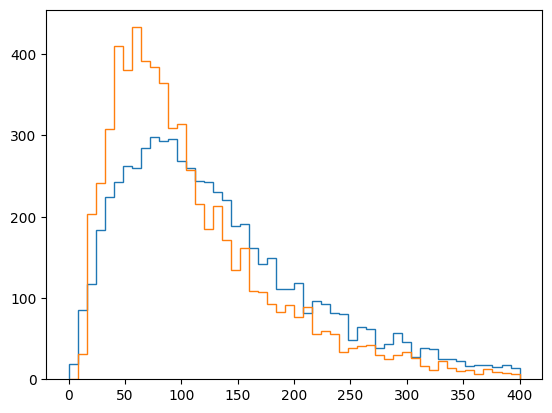

In [25]:
plt.hist(higgsCorrect.pt[0:6400],
         bins=50, histtype="step", range=(0,400))
plt.hist(out_unscaled[:,0].detach().numpy(),
         bins=50, histtype="step", range=(0,400))
                          

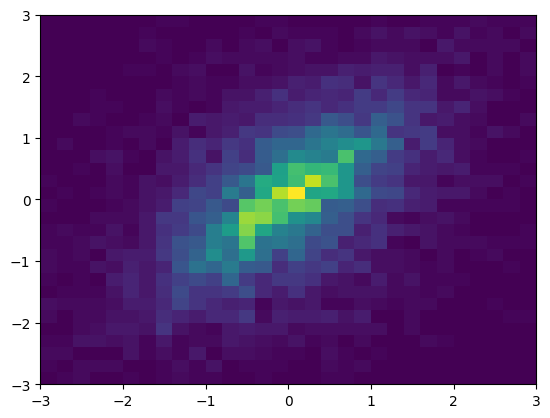

In [28]:
plt.hist2d(ak.to_numpy(higgsCorrect.eta[0:6400]),
           out_unscaled[:,1].detach().numpy(), bins=30, range=((-3, 3),(-3,3)));

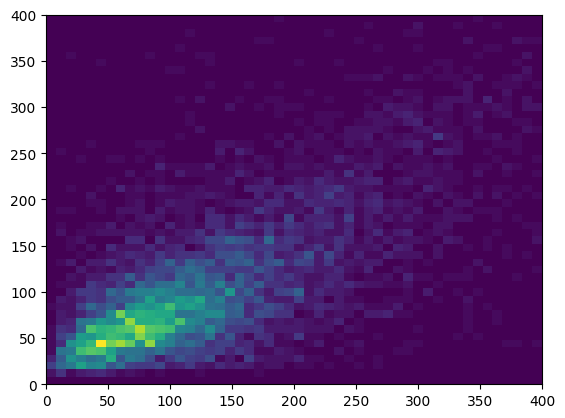

In [30]:
plt.hist2d(ak.to_numpy(higgsCorrect.pt[0:6400]),
           out_unscaled[:,0].detach().numpy(), bins=50, range=((0, 400),(0,400)));

## Load inference output

In [5]:
data_regressed = torch.load(path_unscaled, map_location=device)
#unscaledlog = unscaledTensor*log_std + log_mean
#data_regressed = unscaledlog
#data_regressed[:,:,0] = torch.sign(unscaledlog[:,:,0])*(torch.exp(torch.abs(unscaledlog[:,:,0])) - 1)
print(data_regressed.shape)
data_regressed_scaled = data_regressed.clone()
data_regressed_scaled[:,:,0] = (torch.log(data_regressed_scaled[:,:,0]) + 1)
data_regressed_scaled = (data_regressed_scaled - log_mean)/log_std
target_scaled = data.parton_data.logScaled_data_higgs_t_tbar_ISR

torch.Size([1792125, 3, 3])


In [74]:
for i in range(3):
    print(f"{i}) {MMD(data_regressed_scaled[0:512][:,i], target_scaled[0:512, i], kernel='multiscale', device='cpu')}")

0) 0.3834191825512967
1) 0.33682273576671695
2) 0.3113402246885006


In [60]:
MMD(data_regressed_scaled[0:2048][:,2,:2], target_scaled[0:2048, 2, :2], kernel="rbf", device="cpu")

tensor(0.2488)

In [56]:
MMD(data_regressed_scaled[0:2048][:,0,1:], target_scaled[0:2048, 0, 1:], kernel="multiscale", device="cpu")

tensor(0.1106)

In [37]:
data_regressed[:,:,1].flatten()

tensor([-0.2685, -0.3352,  0.3795,  ..., -0.3043,  0.4397,  0.5344])

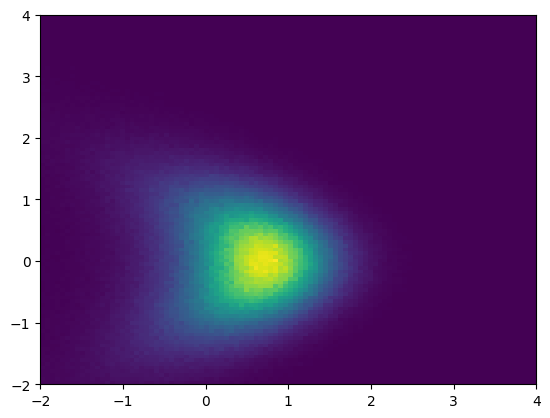

In [62]:
plt.hist2d(target_scaled[:,1,0].numpy(),
           target_scaled[:,1,1].numpy(), bins=100, range=((-2,4),(-2,4)));

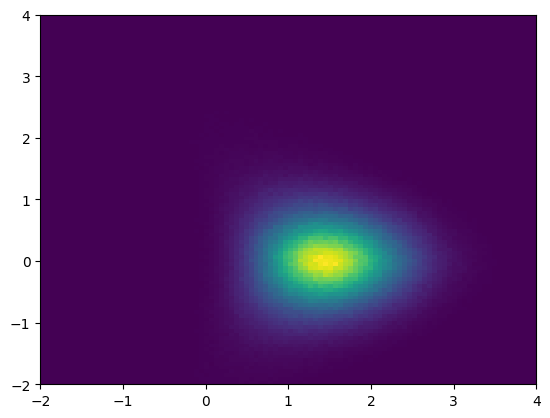

In [63]:
plt.hist2d(data_regressed_scaled[:,1,0].numpy(),
           data_regressed_scaled[:,1,1].numpy(), bins=100, range=((-2,4),(-2,4)));

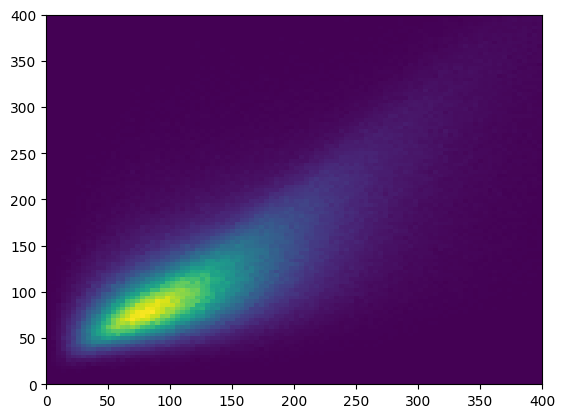

In [32]:
plt.hist2d(ak.to_numpy(higgsCorrect[abs(higgsCorrect.eta)<1].pt),
           data_regressed[:,0,0].flatten().numpy()[abs(higgsCorrect.eta)<1], bins=100, range=((0, 400),(0,400)));

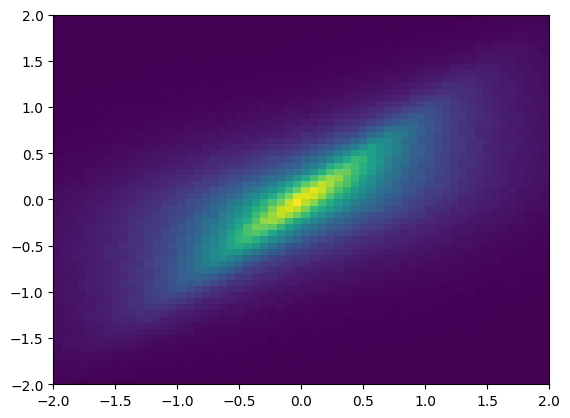

In [45]:
plt.hist2d(ak.to_numpy(higgsCorrect.eta),
           data_regressed[:,0,1].flatten().numpy(), bins=60, range=((-2, 2),(-2,2)));

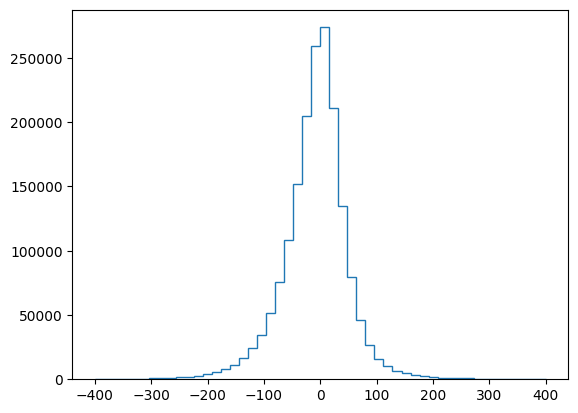

In [11]:
plt.hist(data_regressed[:,0,0].flatten().numpy() - higgsCorrect.pt, bins=50, range=(-400,400), histtype="step");
#plt.hist(higgsCorrect.pt, bins=50, range=(0, 400), histtype="step");

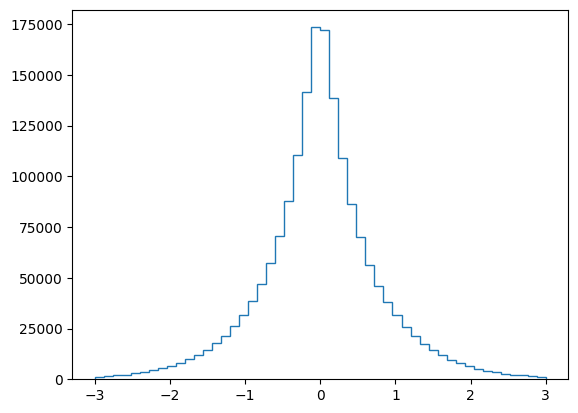

In [12]:
plt.hist(data_regressed[:,0,1].flatten().numpy() - higgsCorrect.eta, bins=50, range=(-3,3), histtype="step");
#plt.hist(higgsCorrect.pt, bins=50, range=(0, 400), histtype="step");

Text(0.5, 1.0, 'TLep')

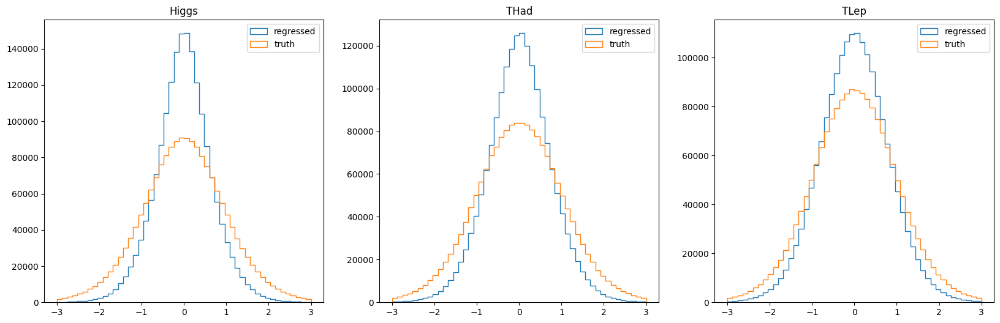

In [75]:
f, axs = plt.subplots(1,3 , figsize =(20,6))
axs[0].hist(data_regressed[:,0,1].flatten().numpy(), bins=50, range=(-3,3), histtype="step", label="regressed");
axs[0].hist(higgsCorrect.eta, bins=50, range=(-3, 3), histtype="step",  label="truth");
axs[0].legend()
axs[0].set_title("Higgs")

axs[1].hist(data_regressed[:,1,1].flatten().numpy(), bins=50, range=(-3,3), histtype="step", label="regressed");
axs[1].hist(thadCorrect.eta, bins=50, range=(-3, 3), histtype="step",  label="truth");
axs[1].legend()
axs[1].set_title("THad")

axs[2].hist(data_regressed[:,2,1].flatten().numpy(), bins=50, range=(-3,3), histtype="step", label="regressed");
axs[2].hist(tlepCorrect.eta, bins=50, range=(-3, 3), histtype="step",  label="truth");
axs[2].legend()
axs[2].set_title("TLep")

Text(0.5, 1.0, 'TLep')

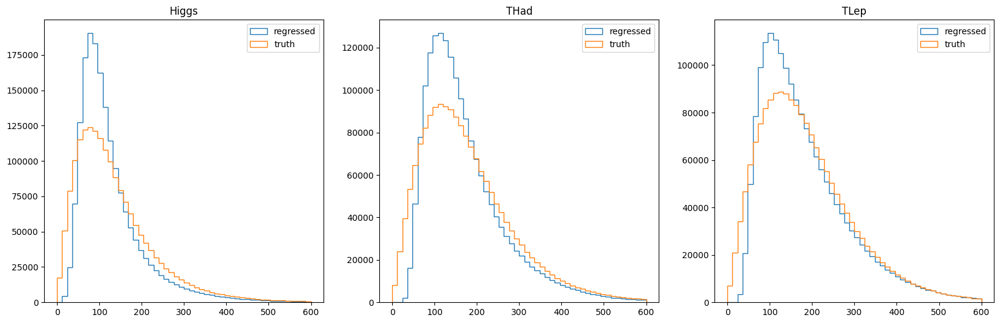

In [76]:
f, axs = plt.subplots(1,3 , figsize =(20,6))
axs[0].hist(data_regressed[:,0,0].flatten().numpy(), bins=50, range=(0, 600), histtype="step", label="regressed");
axs[0].hist(higgsCorrect.pt, bins=50, range=(0, 600), histtype="step",  label="truth");
axs[0].legend()
axs[0].set_title("Higgs")

axs[1].hist(data_regressed[:,1,0].flatten().numpy(),bins=50, range=(0, 600), histtype="step", label="regressed");
axs[1].hist(thadCorrect.pt, bins=50, range=(0, 600), histtype="step",  label="truth");
axs[1].legend()
axs[1].set_title("THad")

axs[2].hist(data_regressed[:,2,0].flatten().numpy(), bins=50, range=(0, 600), histtype="step", label="regressed");
axs[2].hist(tlepCorrect.pt, bins=50, range=(0, 600), histtype="step",  label="truth");
axs[2].legend()
axs[2].set_title("TLep")

In [77]:
data_regressed[:,:,2][ data_regressed[:,:,2]>pi] = data_regressed[:,:,2][ data_regressed[:,:,2]>pi] - 2*pi
data_regressed[:,:,2][ data_regressed[:,:,2]<-pi] = data_regressed[:,:,2][ data_regressed[:,:,2]<-pi] + 2*pi

Text(0.5, 1.0, 'TLep')

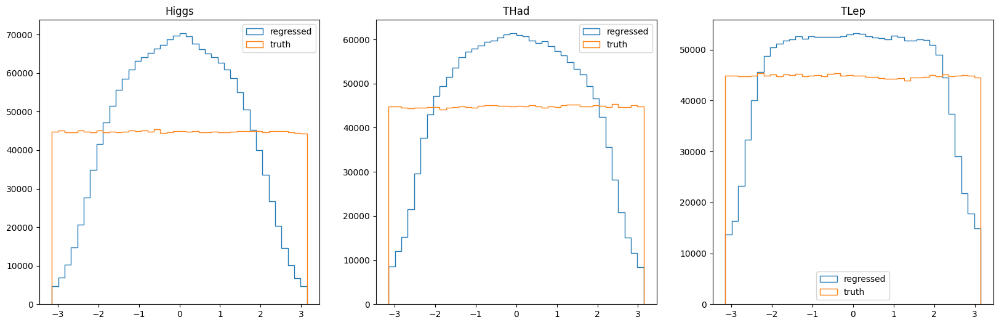

In [78]:
f, axs = plt.subplots(1,3 , figsize =(20,6))
axs[0].hist(data_regressed[:,0,2].flatten().numpy(), bins=40, range=(-pi,pi), histtype="step", label="regressed");
axs[0].hist(higgsCorrect.phi, bins=40, range=(-pi,pi), histtype="step",  label="truth");
axs[0].legend()
axs[0].set_title("Higgs")

axs[1].hist(data_regressed[:,1,2].flatten().numpy(),bins=40, range=(-pi,pi), histtype="step", label="regressed");
axs[1].hist(thadCorrect.phi, bins=40, range=(-pi,pi), histtype="step",  label="truth");
axs[1].legend()
axs[1].set_title("THad")

axs[2].hist(data_regressed[:,2,2].flatten().numpy(), bins=40, range=(-pi,pi), histtype="step", label="regressed");
axs[2].hist(tlepCorrect.phi, bins=40, range=(-pi,pi), histtype="step",  label="truth");
axs[2].legend()
axs[2].set_title("TLep")

In [6]:
M_HIGGS = 125.25
M_TOP = 172.76

higgs = data_regressed[:,0]
thad = data_regressed[:,1]
tlep = data_regressed[:,2]

higgs = vector.array(
    {
        "pt": higgs[:,0].detach().numpy(),
        "eta": higgs[:,1].detach().numpy(),
        "phi": higgs[:,2].detach().numpy(),
        "mass": M_HIGGS*np.ones(higgs.shape[0])
    }
)

thad = vector.array(
    {
        "pt": thad[:,0].detach().numpy(),
        "eta": thad[:,1].detach().numpy(),
        "phi": thad[:,2].detach().numpy(),
        "mass": M_TOP*np.ones(thad.shape[0])
    }
)

tlep = vector.array(
    {
        "pt": tlep[:,0].detach().numpy(),
        "eta": tlep[:,1].detach().numpy(),
        "phi": tlep[:,2].detach().numpy(),
        "mass": M_TOP*np.ones(tlep.shape[0])
    }
)

higgs = ak.with_name(higgs, name="Momentum4D")
thad = ak.with_name(thad, name="Momentum4D")
tlep = ak.with_name(tlep, name="Momentum4D")

In [7]:
gluon_px = -(higgs.px + thad.px + tlep.px)
gluon_py = -(higgs.py + thad.py + tlep.py)
gluon_pz = -(higgs.pz + thad.pz + tlep.pz)
E_gluon = np.sqrt(gluon_px**2 + gluon_py**2 + gluon_pz**2)

gluon_px = np.expand_dims(gluon_px, axis=1)
gluon_py = np.expand_dims(gluon_py, axis=1)
gluon_pz = np.expand_dims(gluon_pz, axis=1)
E_gluon = np.expand_dims(E_gluon, axis=1)

gluon = np.concatenate((E_gluon, gluon_px, gluon_py, gluon_pz), axis=1)

glISR = vector.array(
    {
        "E": gluon[:,0],
        "px": gluon[:,1],
        "py": gluon[:,2],
        "pz": gluon[:,3],
    }
)


glISR = ak.with_name(glISR, name="Momentum4D")

boost_regressed = higgs + thad + tlep + glISR
boost_regressed = to_flat_tensor(boost_regressed, ["t", "x", "y", "z"], axis=1, allow_missing=False)

In [8]:
higgs_tensor = to_flat_tensor(higgs, ["t", "x", "y", "z"], axis=1, allow_missing=False).unsqueeze(dim=1)
thad_tensor = to_flat_tensor(thad, ["t", "x", "y", "z"], axis=1, allow_missing=False).unsqueeze(dim=1)
tlep_tensor = to_flat_tensor(tlep, ["t", "x", "y", "z"], axis=1, allow_missing=False).unsqueeze(dim=1)
gluon_tensor = torch.Tensor(gluon).unsqueeze(dim=1)

new_data_regressed = torch.cat((higgs_tensor, thad_tensor, tlep_tensor, gluon_tensor), dim=1)
print(new_data_regressed.shape)

torch.Size([1792125, 4, 4])


# Split in matched/unmatched

In [22]:
df = ak.from_parquet(path_data)
jets = df.jets
jets = ak.with_name(jets, name="Momentum4D")

x = FindMasks()
higgs_mask = x.higgs_mask(jets)
thad_mask = x.thad_mask(jets)
tlep_mask = x.tlep_mask(jets)
ISR_mask = x.ISR_mask(jets)

In [19]:
higgs_mask.sum()

1081069

In [20]:
higgs_mask.shape

(1792125,)

# Check residual

In [23]:
data_regressed[:, 0, 0]- higgsCorrect.pt,

(<Array [1.57, 16.3, 5.57, ..., 23.5, -77.9, -106] type='1792125 * float64'>,)

(array([[ 40.,  56.,  71., ..., 118.,  98., 126.],
        [ 53.,  60.,  67., ..., 150., 131., 111.],
        [ 61.,  67.,  77., ..., 134., 113., 121.],
        ...,
        [ 81., 104.,  99., ...,  26.,  30.,  12.],
        [ 64.,  84.,  82., ...,  25.,  39.,  28.],
        [ 54.,  77.,  76., ...,  20.,  25.,  24.]]),
 array([-100.,  -96.,  -92.,  -88.,  -84.,  -80.,  -76.,  -72.,  -68.,
         -64.,  -60.,  -56.,  -52.,  -48.,  -44.,  -40.,  -36.,  -32.,
         -28.,  -24.,  -20.,  -16.,  -12.,   -8.,   -4.,    0.,    4.,
           8.,   12.,   16.,   20.,   24.,   28.,   32.,   36.,   40.,
          44.,   48.,   52.,   56.,   60.,   64.,   68.,   72.,   76.,
          80.,   84.,   88.,   92.,   96.,  100.]),
 array([-100.,  -96.,  -92.,  -88.,  -84.,  -80.,  -76.,  -72.,  -68.,
         -64.,  -60.,  -56.,  -52.,  -48.,  -44.,  -40.,  -36.,  -32.,
         -28.,  -24.,  -20.,  -16.,  -12.,   -8.,   -4.,    0.,    4.,
           8.,   12.,   16.,   20.,   24.,   28.,   32.,   

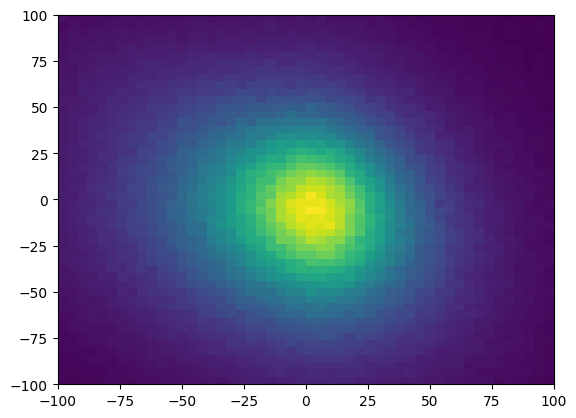

In [26]:
plt.hist2d(
    data_regressed[:, 0, 0].cpu().numpy()- higgsCorrect.pt.to_numpy(),
    data_regressed[:, 1, 0].cpu().numpy()- thadCorrect.pt.to_numpy(),
    bins=50, 
    range=((-100,100), (-100,100))
)

# HIGGS NEW BINNING

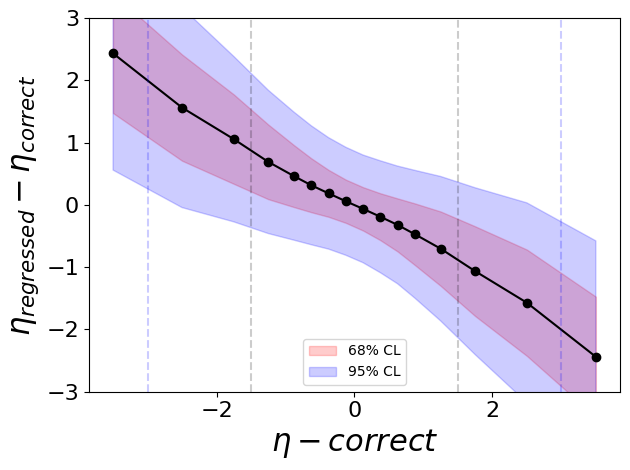

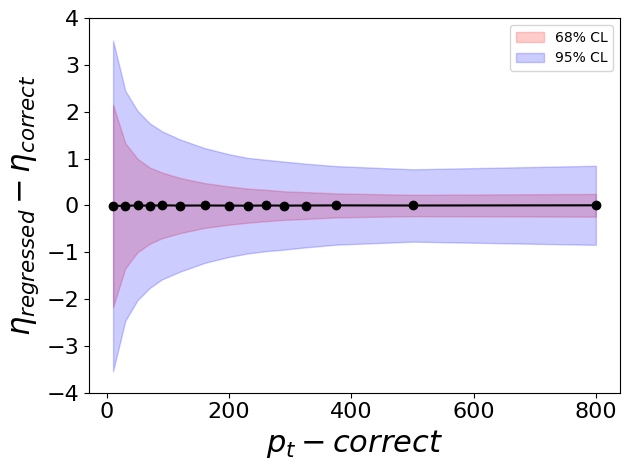

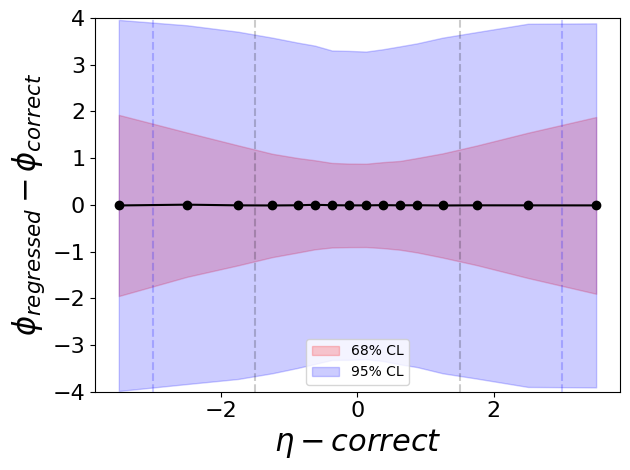

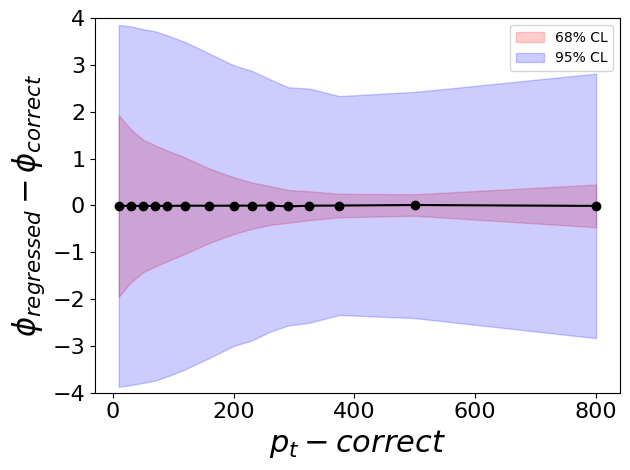

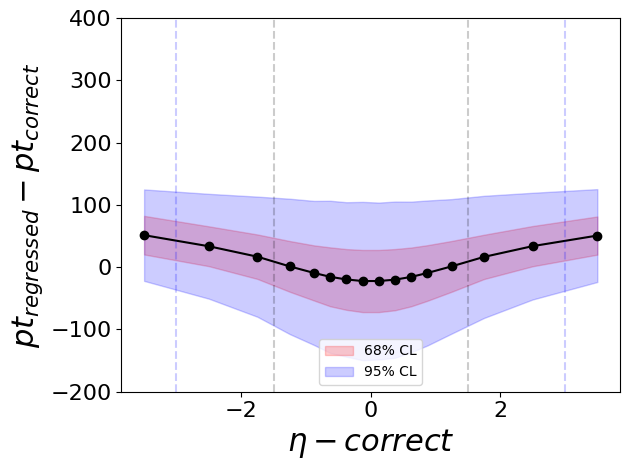

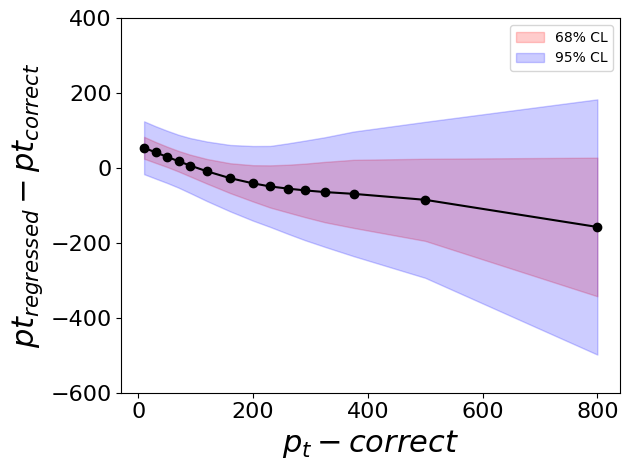

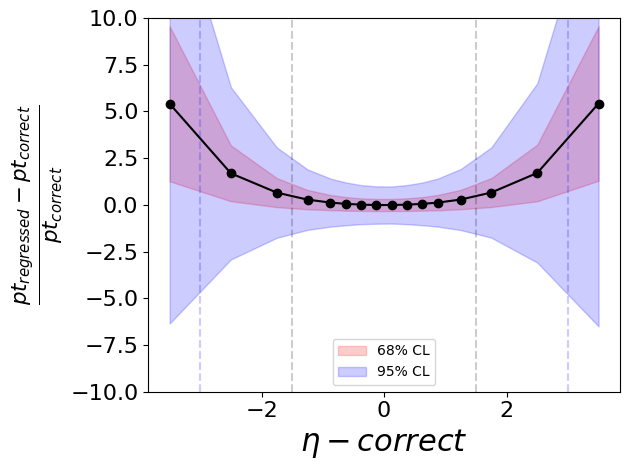

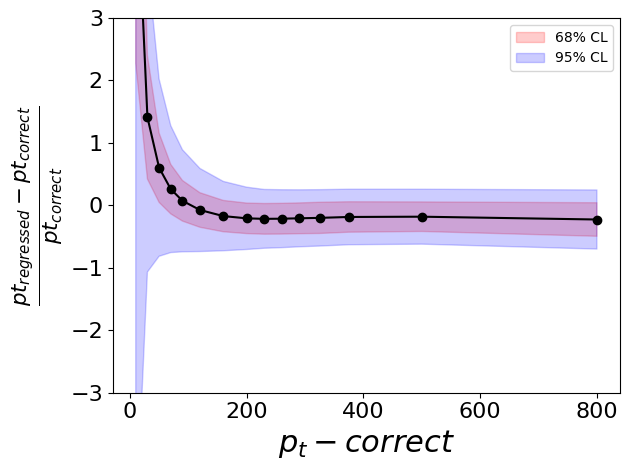

In [21]:
nameDir = 'plots/flow_pretraining_spanet/preTraining_spanet_v2_noProv'
os.makedirs(nameDir, exist_ok=True)

plot_regressionFactor(higgs.eta, higgsCorrect.eta, higgsCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-3, 3), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='1.png')

plot_regressionFactor(higgs.eta, higgsCorrect.eta, higgsCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$',
                     nameDir=nameDir, nameFig='2.png')

plot_regressionFactor(higgs.phi, higgsCorrect.phi, higgsCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='3.png')

plot_regressionFactor(higgs.phi, higgsCorrect.phi, higgsCorrect.pt, matched=None,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$',
                     nameDir=nameDir, nameFig='4.png')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-200,400], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='5.png')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-600,400], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$',
                     nameDir=nameDir, nameFig='6.png')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-10,10], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True,
                     nameDir=nameDir, nameFig='7.png')

plot_regressionFactor(higgs.pt, higgsCorrect.pt, higgsCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True,
                     nameDir=nameDir, nameFig='8.png')

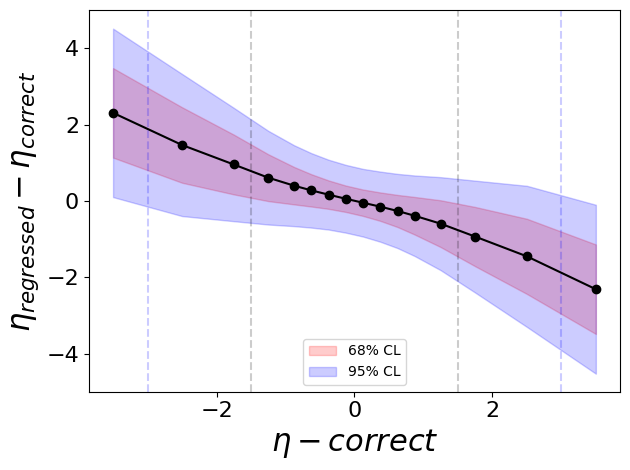

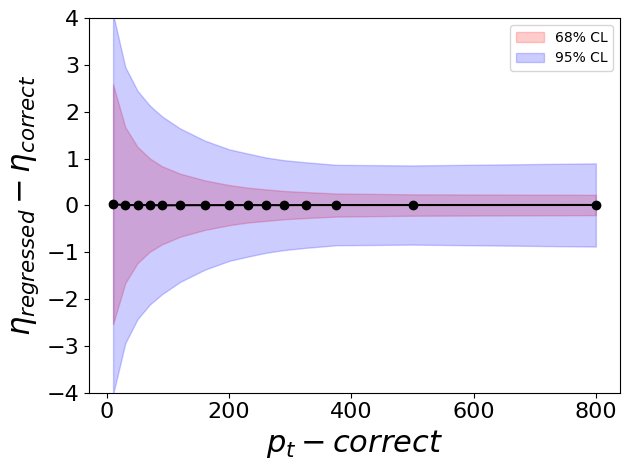

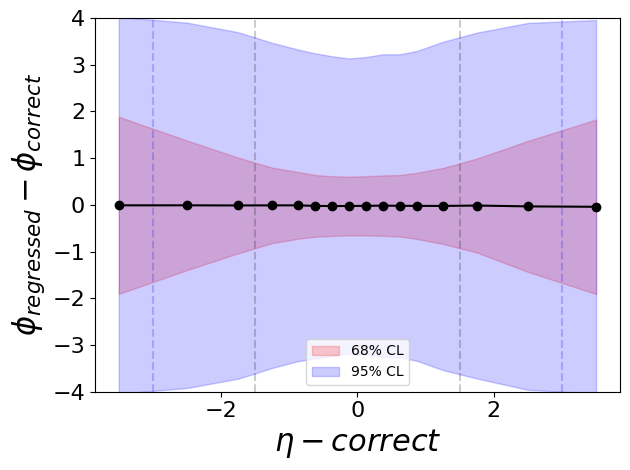

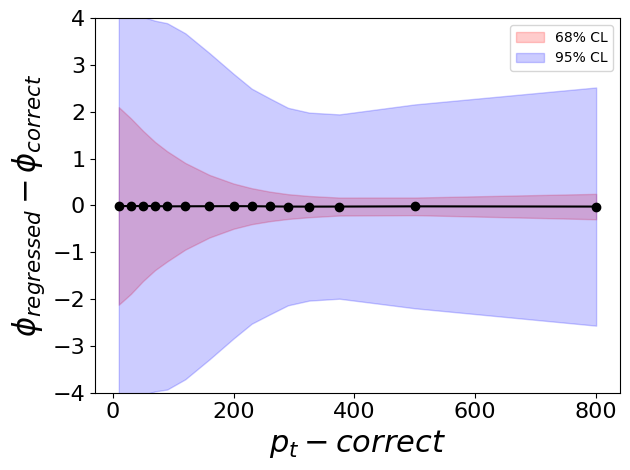

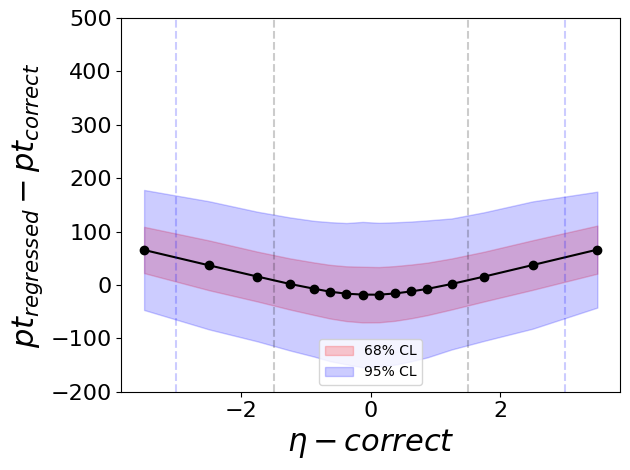

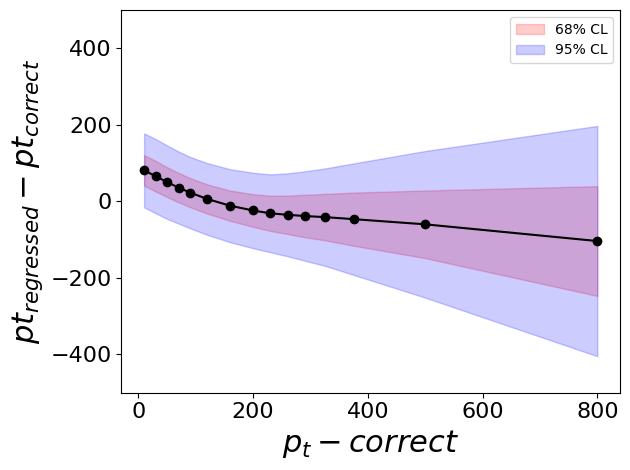

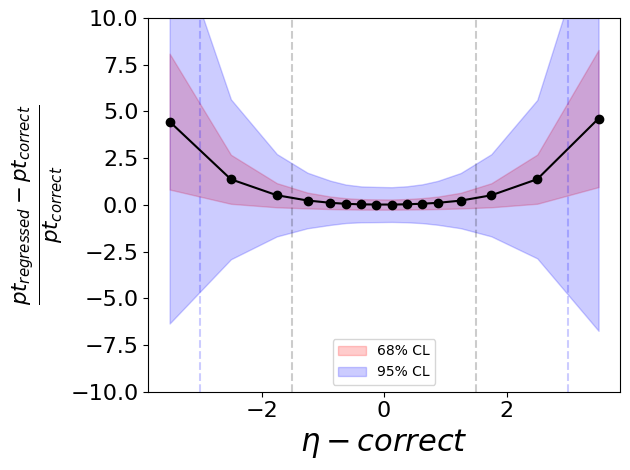

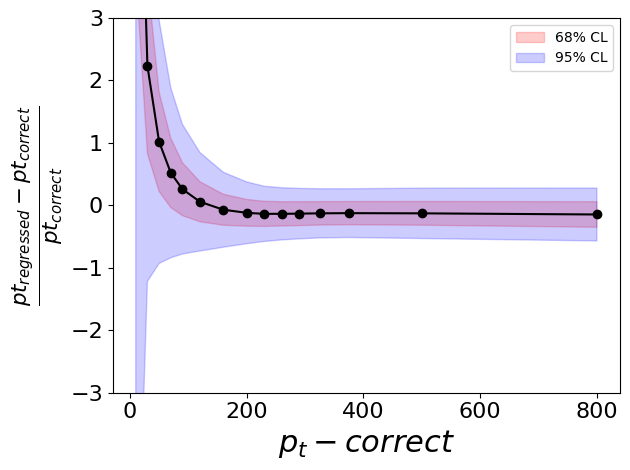

In [22]:
plot_regressionFactor(thad.eta, thadCorrect.eta, thadCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='9.png')

plot_regressionFactor(thad.eta, thadCorrect.eta, thadCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$',
                     nameDir=nameDir, nameFig='10.png')

plot_regressionFactor(thad.phi, thadCorrect.phi, thadCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='11.png')

plot_regressionFactor(thad.phi, thadCorrect.phi, thadCorrect.pt, matched=None,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$',
                     nameDir=nameDir, nameFig='12.png')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-200,500], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='13.png')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-500,500], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$',
                     nameDir=nameDir, nameFig='14.png')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-10,10], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True,
                     nameDir=nameDir, nameFig='15.png')

plot_regressionFactor(thad.pt, thadCorrect.pt, thadCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True,
                     nameDir=nameDir, nameFig='16.png')

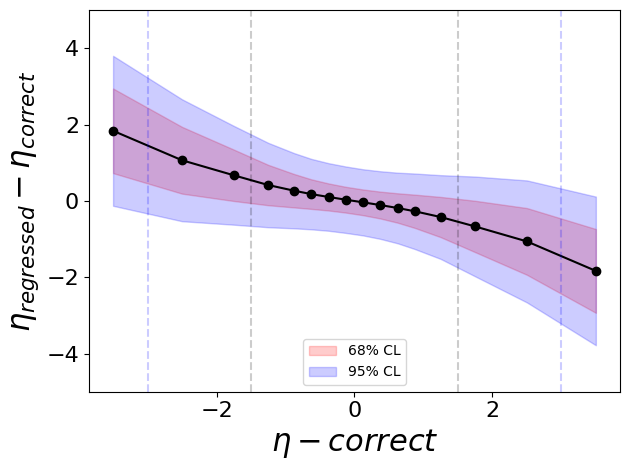

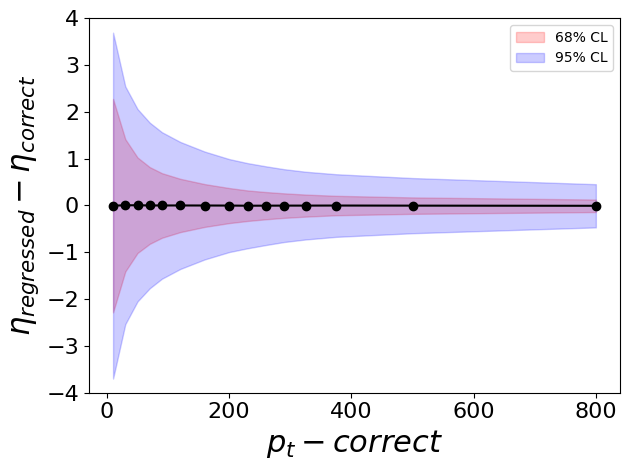

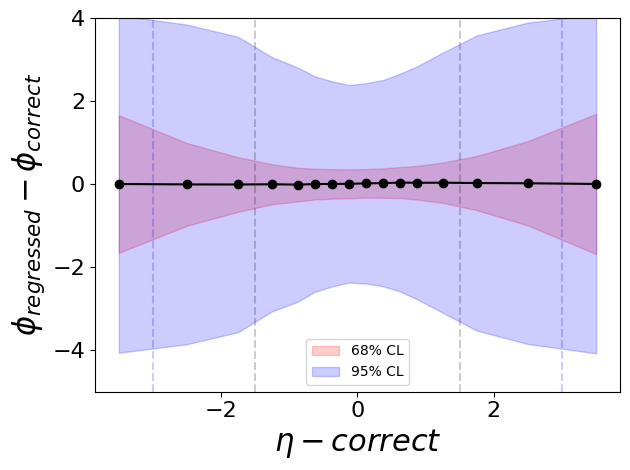

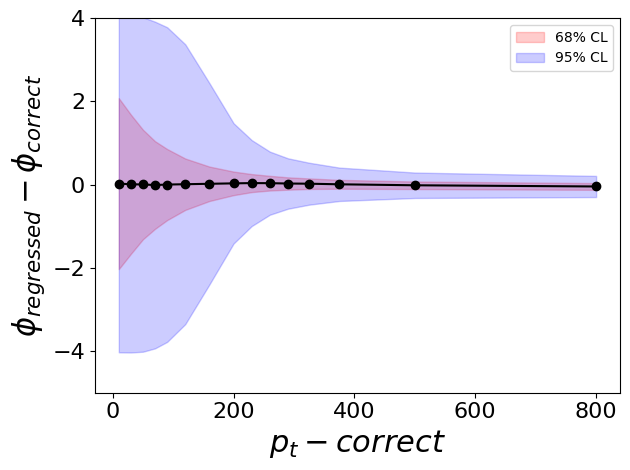

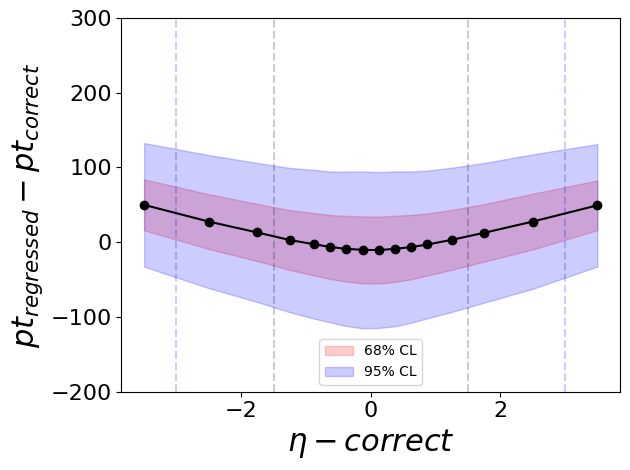

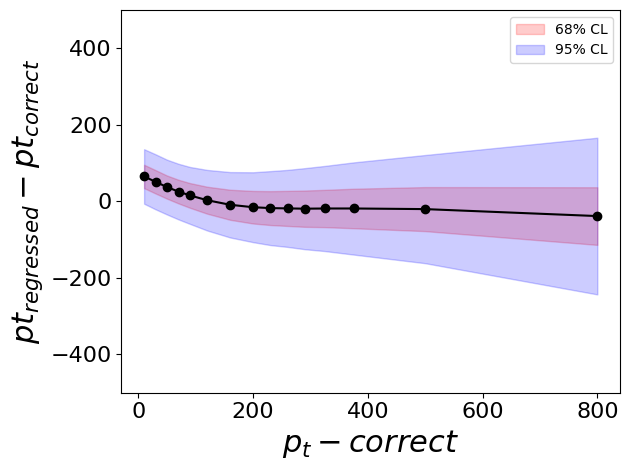

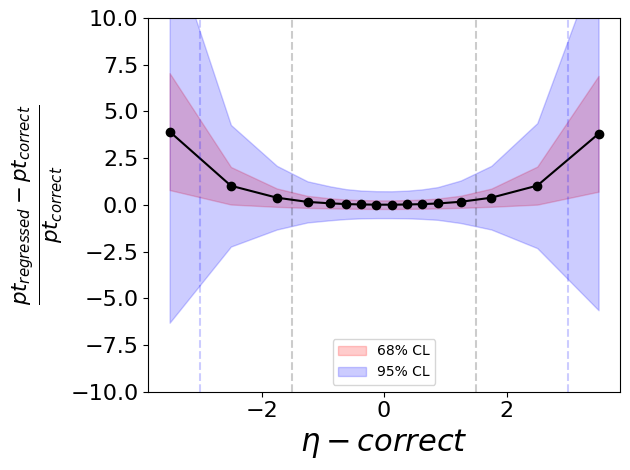

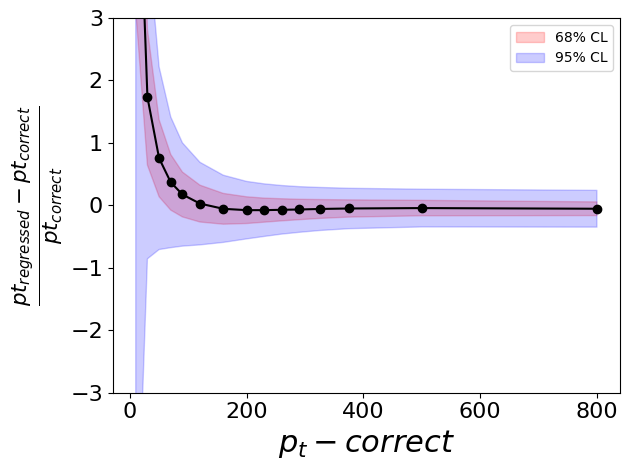

In [11]:
plot_regressionFactor(tlep.eta, tlepCorrect.eta, tlepCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='17.png')

plot_regressionFactor(tlep.eta, tlepCorrect.eta, tlepCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$',
                     nameDir=nameDir, nameFig='18.png')

plot_regressionFactor(tlep.phi, tlepCorrect.phi, tlepCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='19.png')

plot_regressionFactor(tlep.phi, tlepCorrect.phi, tlepCorrect.pt, matched=None,
                      limTarget=(0, 1000), bins=20, ylim=[-5,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$',
                     nameDir=nameDir, nameFig='20.png')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-200,300], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='21.png')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-500,500], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$',
                     nameDir=nameDir, nameFig='22.png')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.eta, matched=None,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-10,10], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True,
                     nameDir=nameDir, nameFig='23.png')

plot_regressionFactor(tlep.pt, tlepCorrect.pt, tlepCorrect.pt, matched=None,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True,
                     nameDir=nameDir, nameFig='24.png')

In [12]:
plot_regressionFactor(glISR.eta, glISRCorrect.eta, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='25.png')

plot_regressionFactor(glISR.eta, glISRCorrect.eta, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-2.5,2.5], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$',
                     nameDir=nameDir, nameFig='26.png')

plot_regressionFactor(glISR.phi, glISRCorrect.phi, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-6,7], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='27.png')

plot_regressionFactor(glISR.phi, glISRCorrect.phi, glISRCorrect.pt, matched=ISR_mask,
                      limTarget=(0, 1000), bins=20, ylim=[-6,7], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$',
                     nameDir=nameDir, nameFig='28.png')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-500,900], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True,
                     nameDir=nameDir, nameFig='29.png')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-500,900], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$',
                     nameDir=nameDir, nameFig='30.png')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.eta, matched=ISR_mask,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-10,10], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True,
                     nameDir=nameDir, nameFig='31.png')

plot_regressionFactor(glISR.pt, glISRCorrect.pt, glISRCorrect.pt, matched=ISR_mask,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True,
                     nameDir=nameDir, nameFig='32.png')

NameError: name 'ISR_mask' is not defined

# Check higgs as sum of 2 b jets

In [13]:
jets, partons_matched, partons, generator_info, lepton_partons, lepton_reco,  met, higgs = ak.unzip(ak.from_parquet("../../dataset/v7/all_jets_fullRun2_v1.parquet"))
higgs_jets =  ak.with_name(jets[jets.prov==1], name= "Momentum4D")
higgs_jets = higgs_jets[ak.num(higgs_jets)==2]
H = higgs_jets[:,0]+higgs_jets[:,1]
higgs_parton = ak.with_name(partons[partons.prov==1], name="Momentum4D")
Hparton = (higgs_parton[:, 0] + higgs_parton[:, 1])[ak.num(higgs_jets)==2]
masked = np.ones(ak.to_numpy(Hparton).shape)
masked = np.array(masked, dtype='bool')


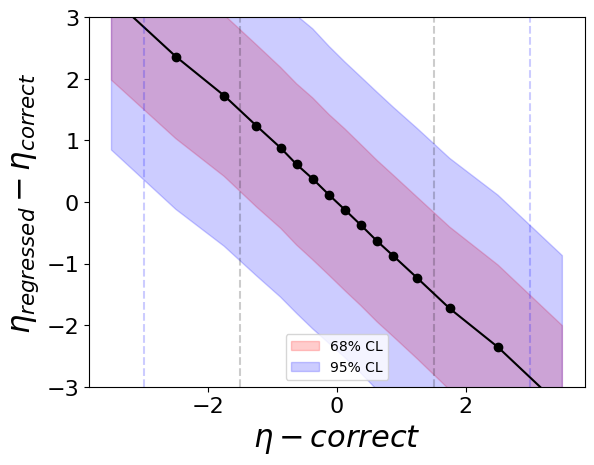

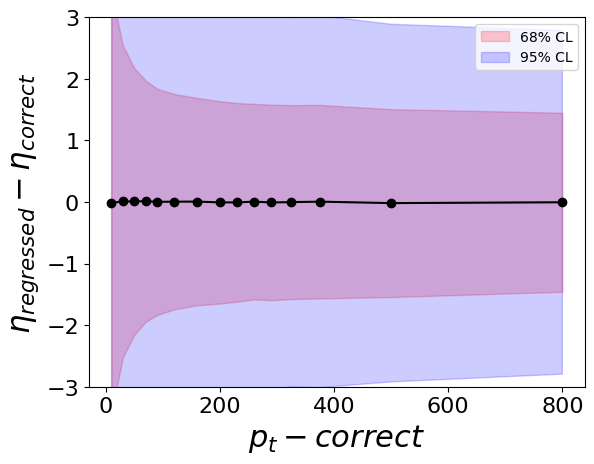

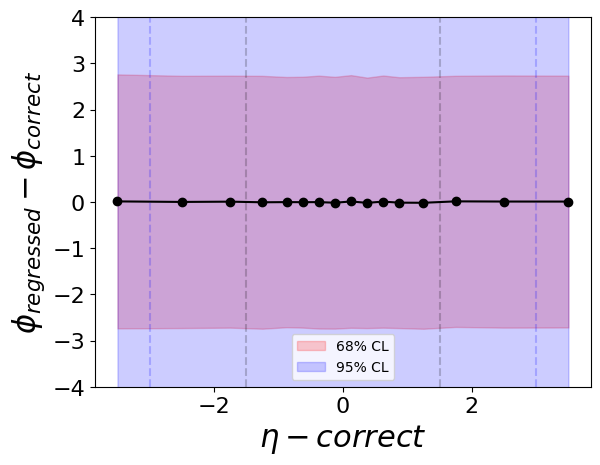

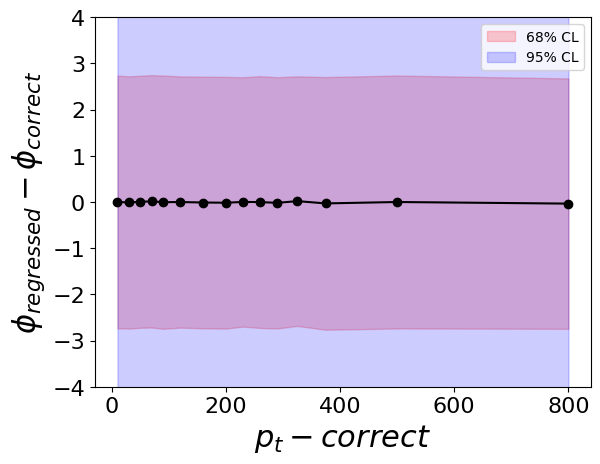

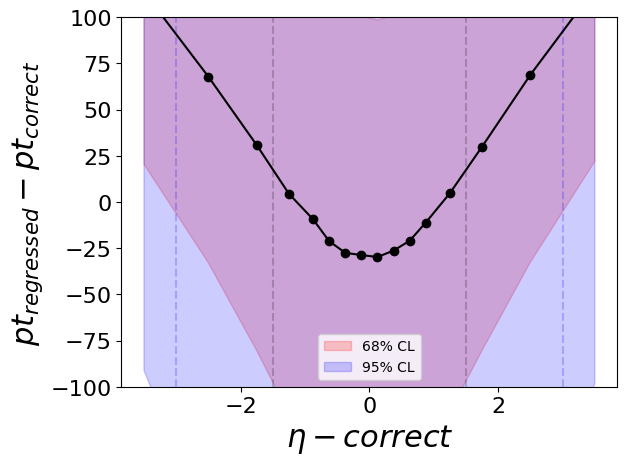

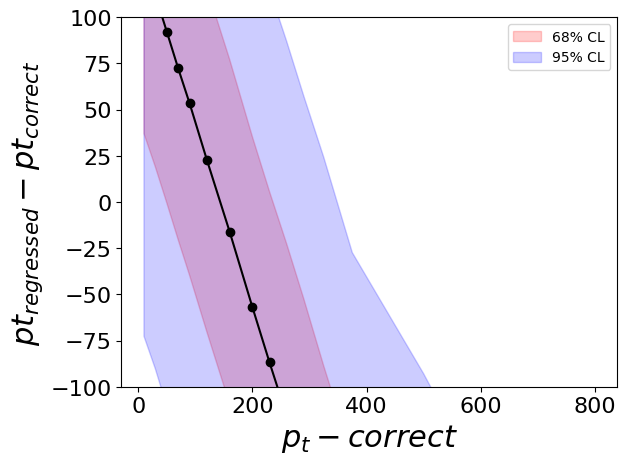

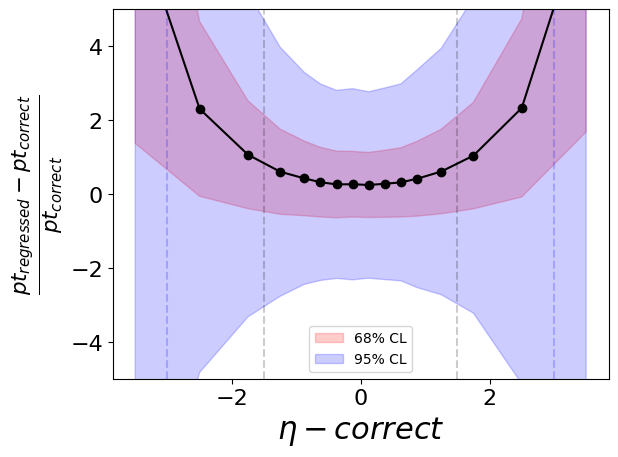

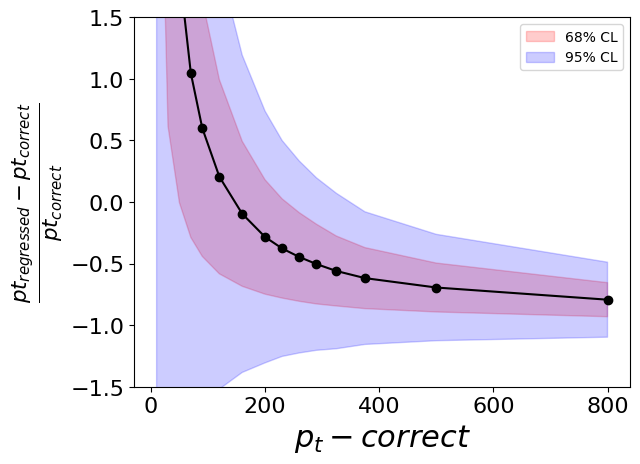

In [14]:
plot_regressionFactor(H.eta, Hparton.eta, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-3,3], xname='$\eta-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$', eta=True)

plot_regressionFactor(H.eta, Hparton.eta, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-3,3], xname='$p_t-correct$',
                      yname='$\eta_{regressed} - \eta_{correct}$')

plot_regressionFactor(H.phi, Hparton.phi, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-4,4], xname='$\eta-correct$',
                      yname='$\phi_{regressed} - \phi_{correct}$', eta=True)

plot_regressionFactor(H.phi, Hparton.phi, Hparton.pt, matched=masked,
                      limTarget=(0, 1000), bins=20, ylim=[-4,4], xname='$p_t-correct$',
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      yname='$\phi_{regressed} - \phi_{correct}$')

plot_regressionFactor(H.pt, Hparton.pt, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-100,100], xname='$\eta-correct$',
                      yname='$pt_{regressed} - pt_{correct}$', eta=True)

plot_regressionFactor(H.pt, Hparton.pt, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-100,100], xname='$p_t-correct$',
                      yname='$pt_{regressed} - pt_{correct}$')

plot_regressionFactor(H.pt, Hparton.pt, Hparton.eta, matched=masked,
                      intervalTargetVar=[-4,-3,-2,-1.5,-1,-0.75,-0.5,-0.25,0,0.25,0.5,0.75,1,1.5,2,3,4],
                      limTarget=(-4, 4), bins=8, ylim=[-5,5], xname='$\eta-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', eta=True, ratio=True)

plot_regressionFactor(H.pt, Hparton.pt, Hparton.pt, matched=masked,
                      intervalTargetVar=[0,20,40,60,80,100,140,180,220,240,280,300,350,400,600,1000],
                      limTarget=(0, 1000), bins=20, ylim=[-1.5,1.5], xname='$p_t-correct$',
                      yname=r'$\frac{pt_{regressed} - pt_{correct}}{pt_{correct}}$', ratio=True)

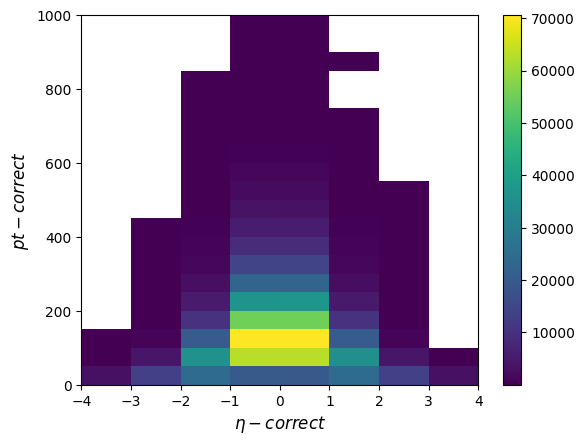

In [19]:
colormap='viridis'
my_viridis = mpl.colormaps[colormap].with_extremes(under="white")

fontsize = 12
labelsize = 10

plt.hist2d(np.array(higgsCorrect.eta[higgs_mask]), np.array(higgsCorrect.pt[higgs_mask]),
           bins=(8, 20), range=((-4,4),(0,1000)),
           cmap=my_viridis, vmin=1) 
plt.xlabel('$\eta-correct$', fontsize=fontsize)
plt.ylabel('$pt-correct$', fontsize=fontsize)
plt.colorbar()
plt.show()

In [14]:
def plot_var2d(higgs_var1, higgs_var2, thad_var1, thad_var2, tlep_var1, tlep_var2,
             ISR_var1, ISR_var2, name1, name2, nameFig, start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
             higgs_mask=1, thad_mask=1, tlep_mask=1, ISR_mask=1, neg_Mask=False, log=False, name='da', nameunit=''):
        
        
        if neg_Mask:
            higgs_mask = np.logical_not(higgs_mask)
            thad_mask = np.logical_not(thad_mask)
            tlep_mask = np.logical_not(tlep_mask)
            ISR_mask = np.logical_not(ISR_mask)

        # Quick construction, no other imports needed:
        hist2d_var_higgs = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_thad = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_tlep = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_ISR = (
          Hist.new
          .Reg(bins=bins1, start=start1, stop=stop1, name=name1, label=name1)
          .Reg(bins=bins2, start=start2, stop=stop2, name=name2, label=name2)
          .Double())

        hist2d_var_higgs.fill(higgs_var1[higgs_mask],
                            higgs_var2[higgs_mask])

        hist2d_var_thad.fill(thad_var1[thad_mask],
                            thad_var2[thad_mask])

        hist2d_var_tlep.fill(tlep_var1[tlep_mask],
                            tlep_var2[tlep_mask])

        hist2d_var_ISR.fill(ISR_var1[ISR_mask],
                            ISR_var2[ISR_mask])

        colormap='viridis'
        my_viridis = mpl.colormaps[colormap].with_extremes(under="white")
        
        fontsize = 20
        labelsize=14
        labels = ['higgs', 'thad', 'tlep', 'ISR']
        hist2d_list = [hist2d_var_higgs, hist2d_var_thad, hist2d_var_tlep, hist2d_var_ISR]
        
        
        fig, axs = plt.subplots(1, 4, figsize=(16, 6))

        if log:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, norm=mpl.colors.LogNorm(vmin=1))
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

        else:
            for i in range(4):
                w, x, y = hist2d_list[i].to_numpy()
                mesh = axs[i].pcolormesh(x, y, w.T, cmap=my_viridis, vmin=1)
                axs[i].set_xlabel(f"{name}-correct {nameunit}", fontsize=fontsize)
                axs[i].set_ylabel(f"{name}-regressed {nameunit}", fontsize=fontsize)
                axs[i].set_title(f"{labels[i]}", fontsize=fontsize)
                axs[i].tick_params(axis='both', which='major', labelsize=labelsize)
                cbar = fig.colorbar(mesh)
                cbar.ax.tick_params(labelsize=labelsize)
                plt.tight_layout()

In [15]:
all_mask = higgsCorrect.pt > 0

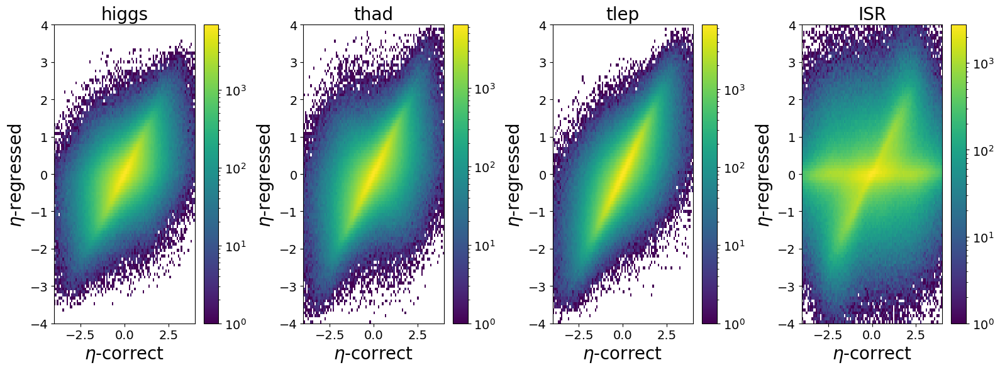

In [17]:
plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=all_mask, thad_mask=all_mask, tlep_mask=all_mask, ISR_mask=all_mask,
           neg_Mask=False, log=True, name='$\eta$')

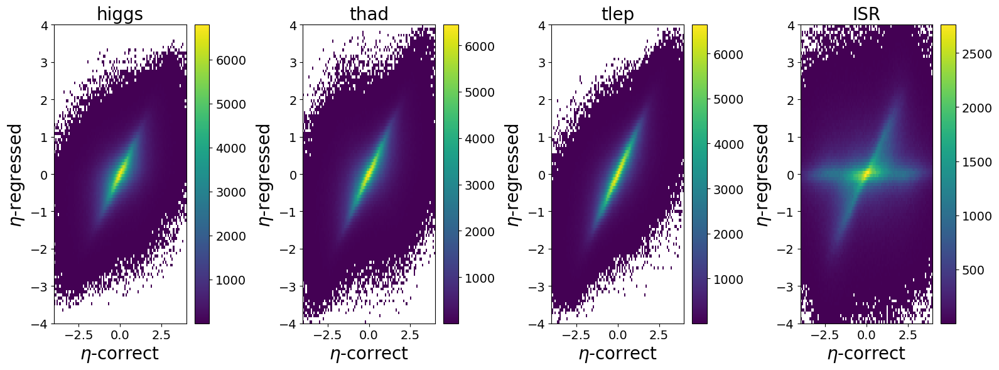

In [18]:
plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=all_mask, thad_mask=all_mask, tlep_mask=all_mask, ISR_mask=all_mask,
           neg_Mask=False, log=False, name='$\eta$')

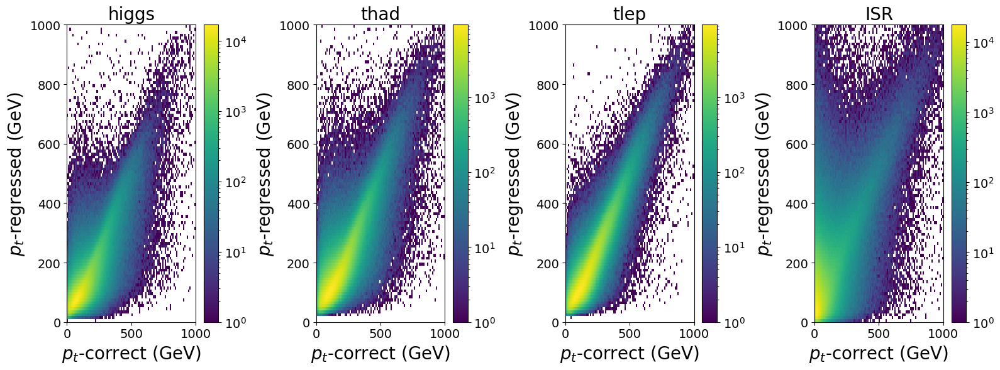

In [19]:
plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=all_mask, thad_mask=all_mask, tlep_mask=all_mask, ISR_mask=all_mask,
           neg_Mask=False, log=True, name='$p_t$', nameunit='(GeV)')

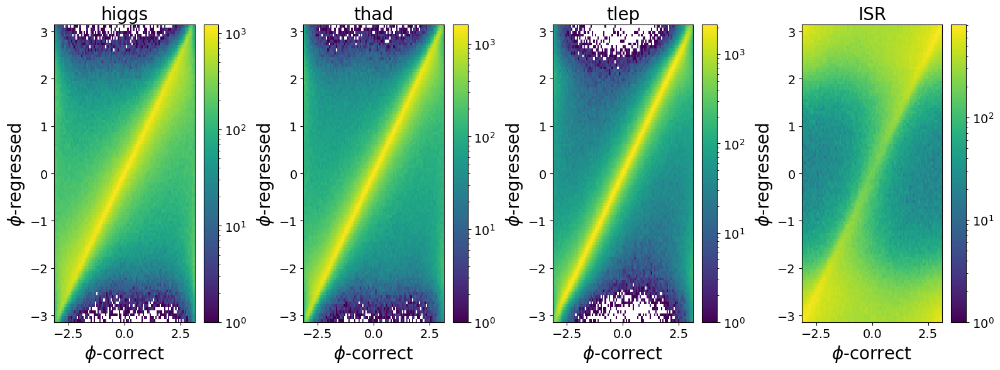

In [20]:
plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$eta-correct$', name2='$eta-regressed$', nameFig='29.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=all_mask, thad_mask=all_mask, tlep_mask=all_mask, ISR_mask=all_mask,
           neg_Mask=False, log=True, name='$\phi$')

# Plots (higgsCorrect/thadCorrect/... higgs/thad ...)


In [42]:
plots = SavePlots('plots/try6')

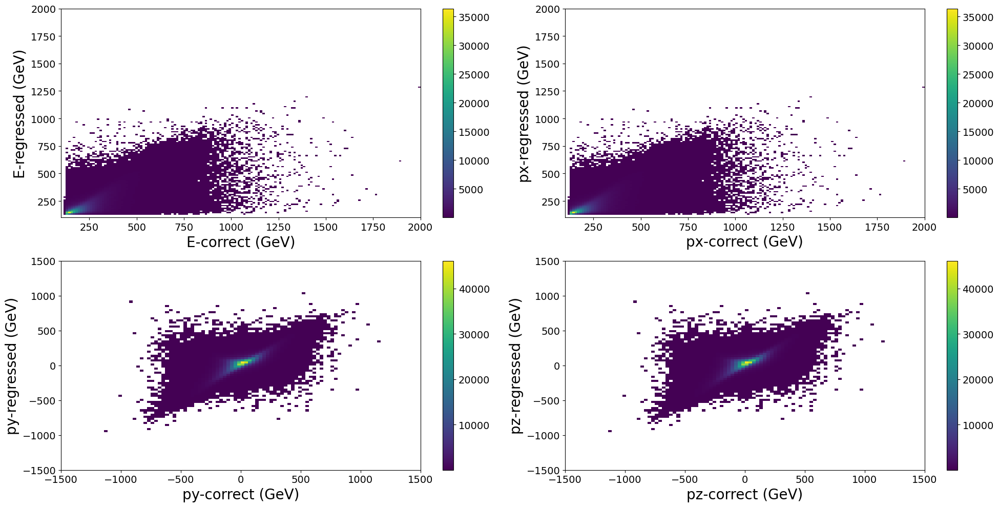

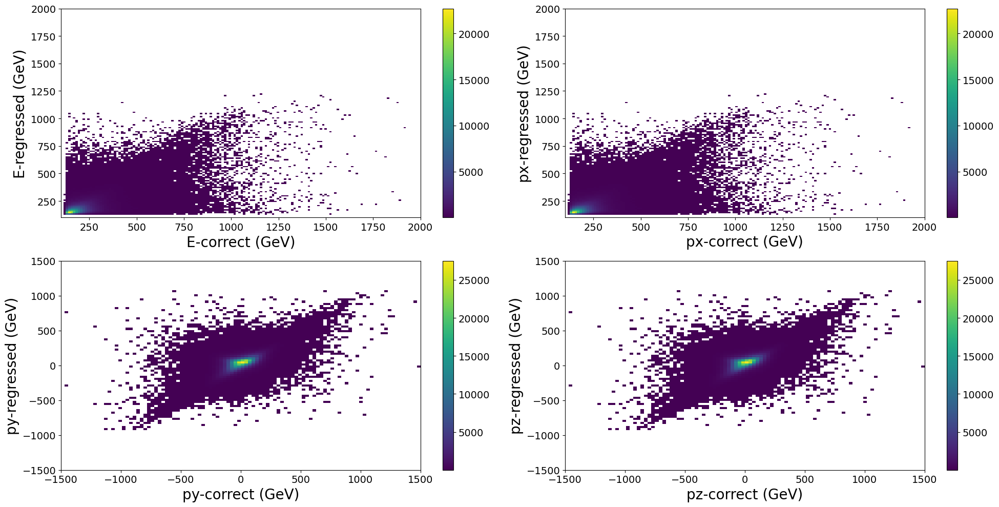

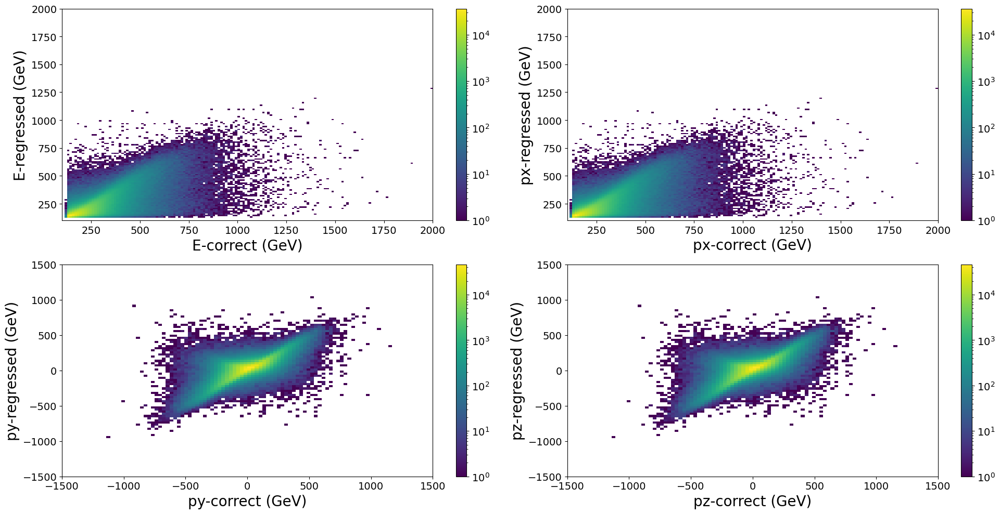

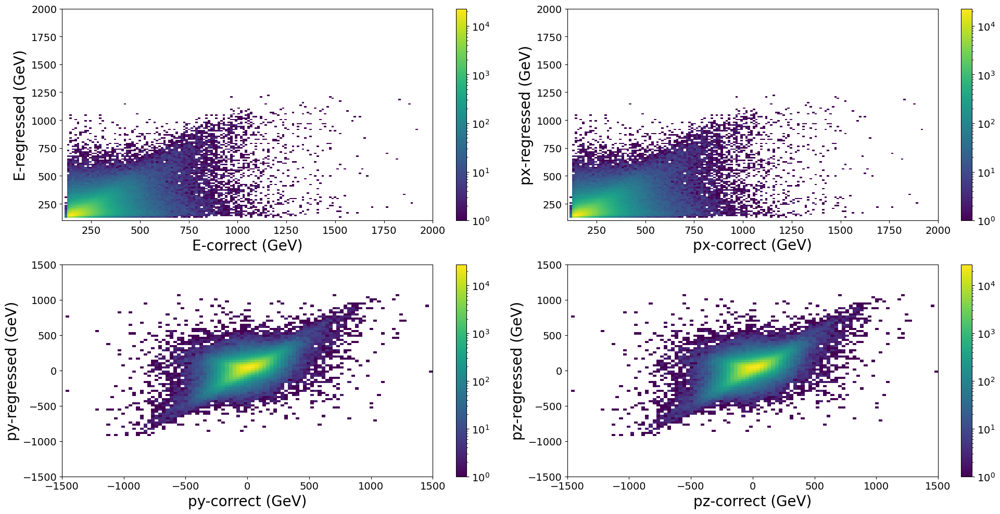

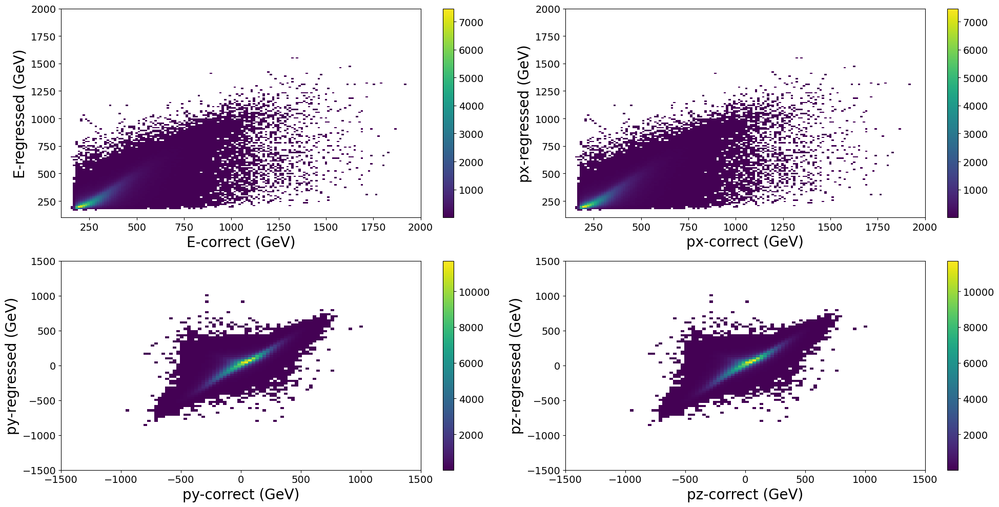

...

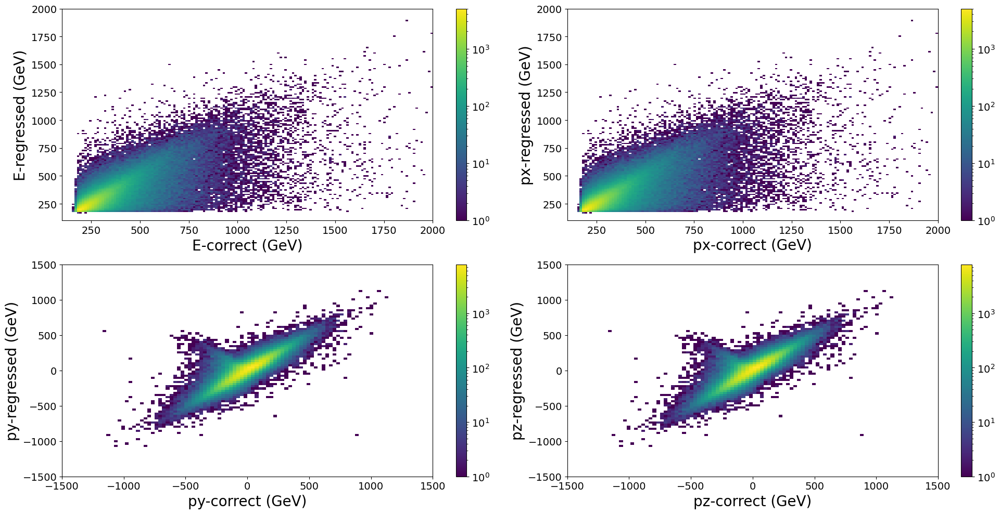

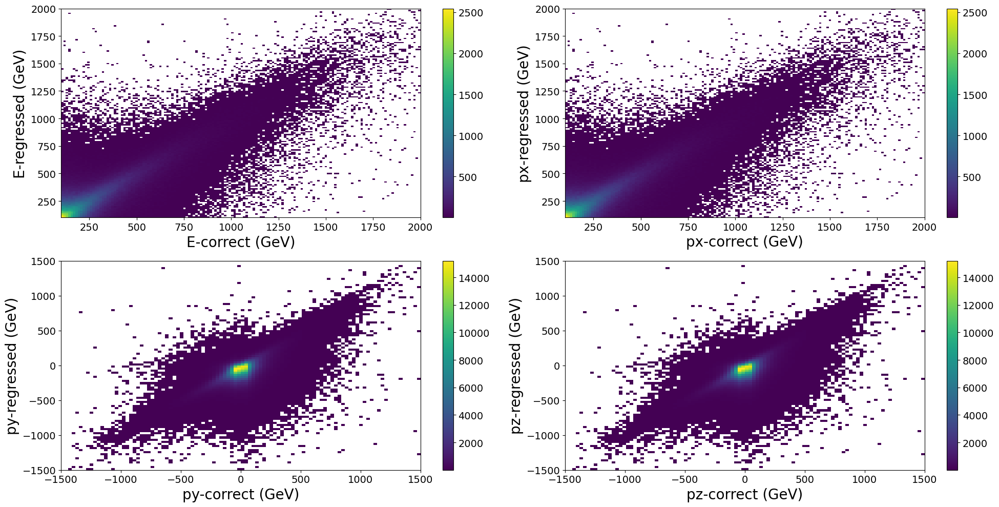

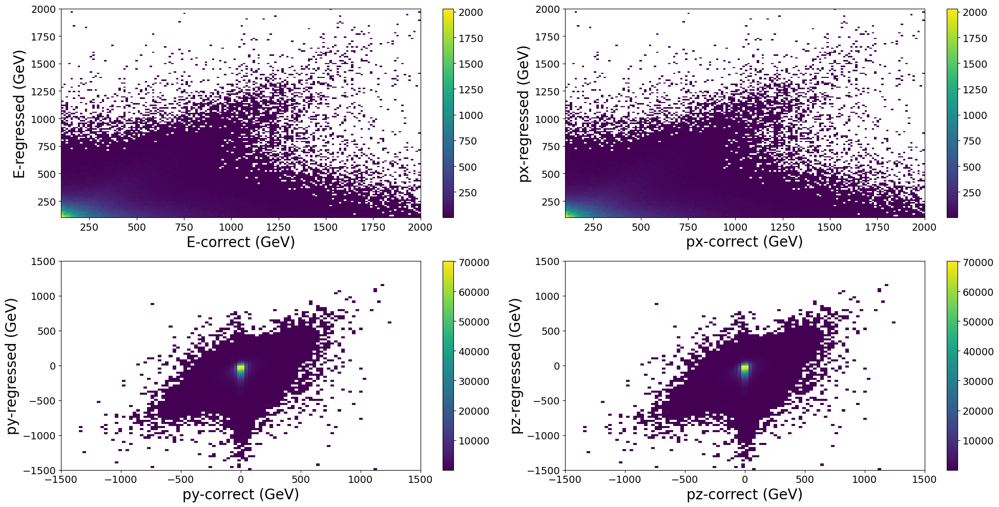

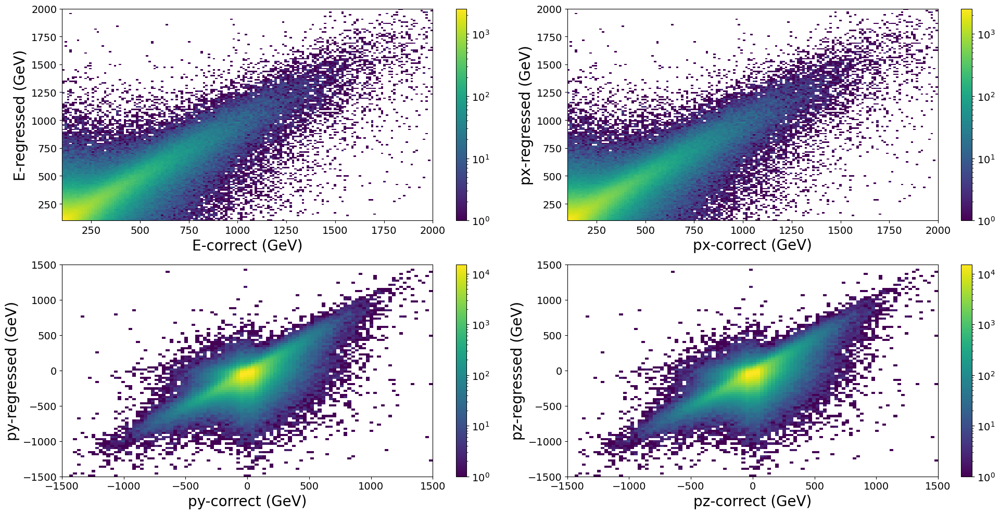

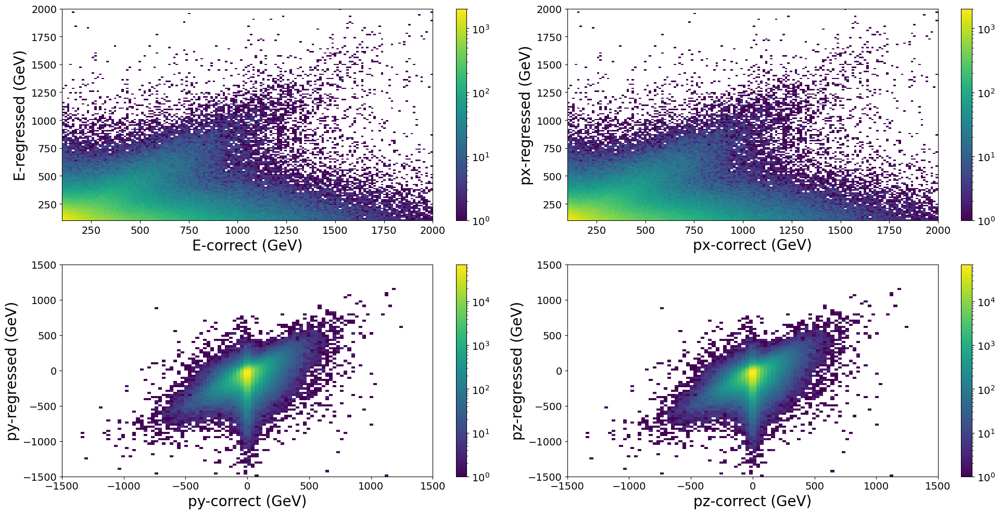

In [43]:
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='1.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='2.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='3.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=higgsCorrect, particle=higgs, particle_mask=higgs_mask,
                    nameFig='4.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='5.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='6.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='7.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=thadCorrect, particle=thad, particle_mask=thad_mask,
                    nameFig='8.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='9.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='10.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='11.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=tlepCorrect, particle=tlep, particle_mask=tlep_mask,
                    nameFig='12.png', neg_Mask=True, log=True, nameunit='(GeV)')

plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='13.png', neg_Mask=False, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='14.png', neg_Mask=True, log=False, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='15.png', neg_Mask=False, log=True, nameunit='(GeV)')
plots.plot_particle(particleCorrect=glISRCorrect, particle=glISR, particle_mask=ISR_mask,
                    nameFig='16.png', neg_Mask=True, log=True, nameunit='(GeV)')

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

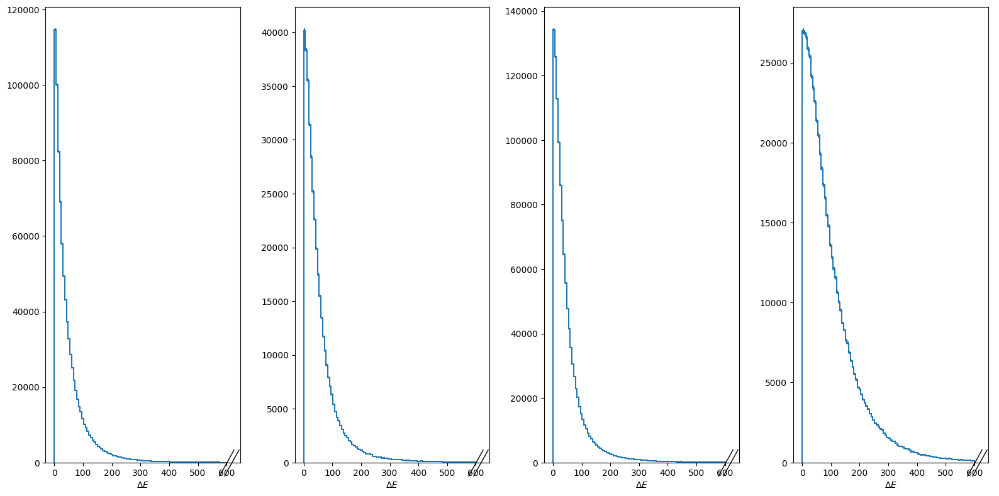

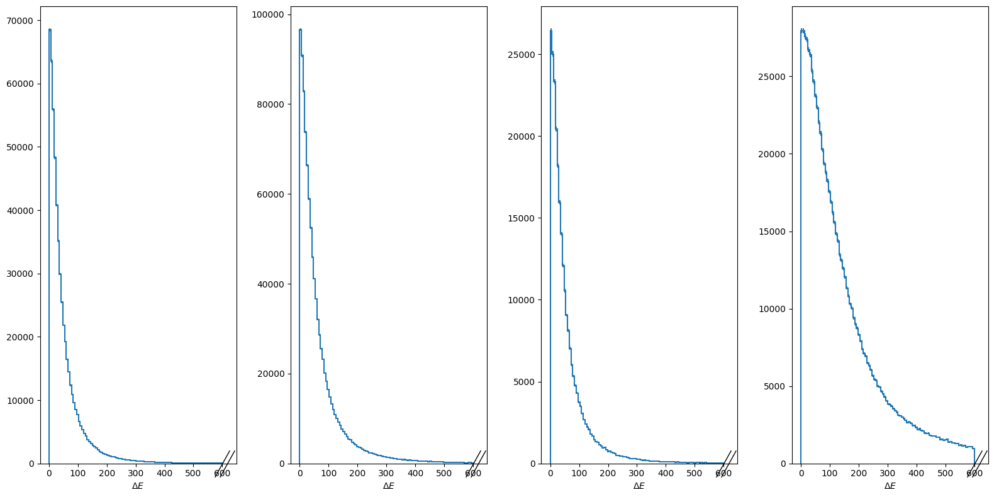

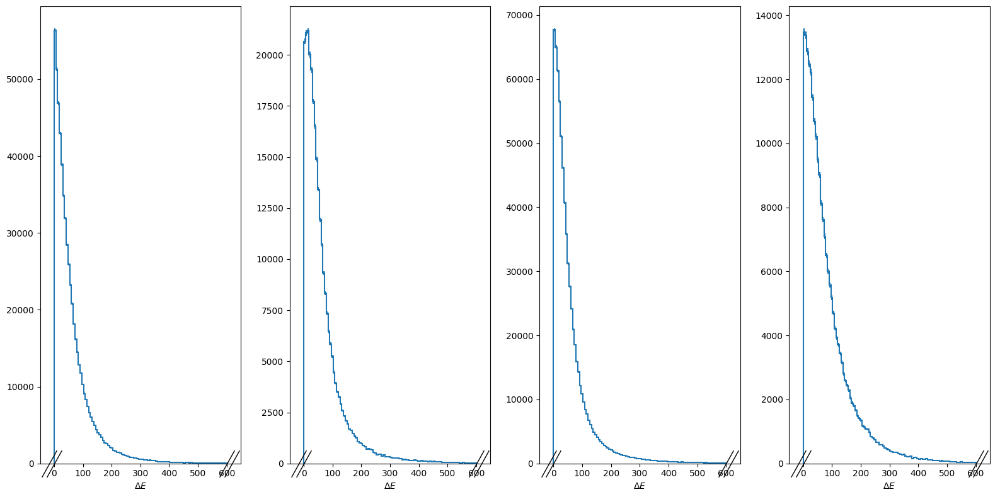

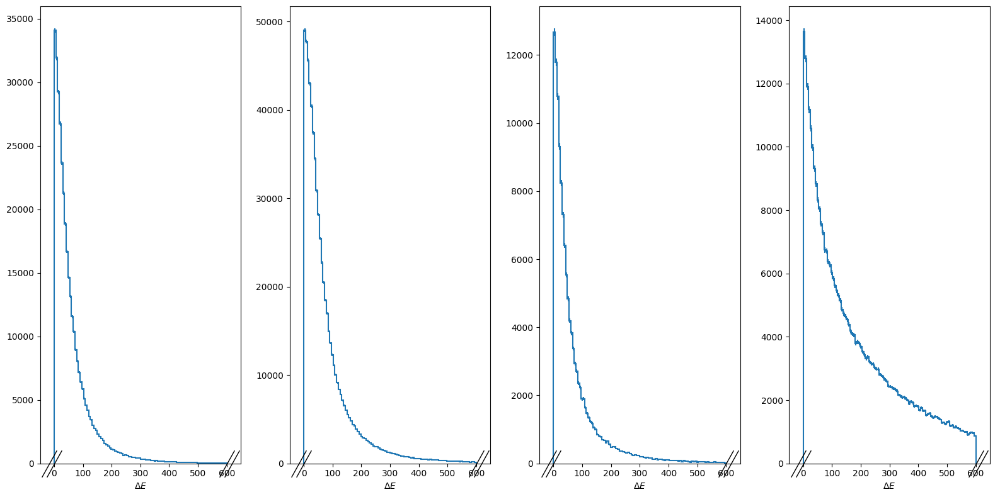

In [16]:
higgs_DiffE = np.abs(higgsCorrect.E - higgs.E)
thad_DiffE = np.abs(thadCorrect.E - thad.E)
tlep_DiffE = np.abs(tlepCorrect.E - tlep.E)
glISR_DiffE = np.abs(glISRCorrect.E - glISR.E)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='17.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='18.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffE = higgsCorrect.E - higgs.E
thad_DiffE = thadCorrect.E - thad.E
tlep_DiffE = tlepCorrect.E - tlep.E
glISR_DiffE = glISRCorrect.E - glISR.E

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='19.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffE, thad_var1=thad_DiffE,
                 tlep_var1=tlep_DiffE, ISR_var1=glISR_DiffE,
                 name1='$\Delta E$', nameFig='20.png',
                 start1=0, stop1=600, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

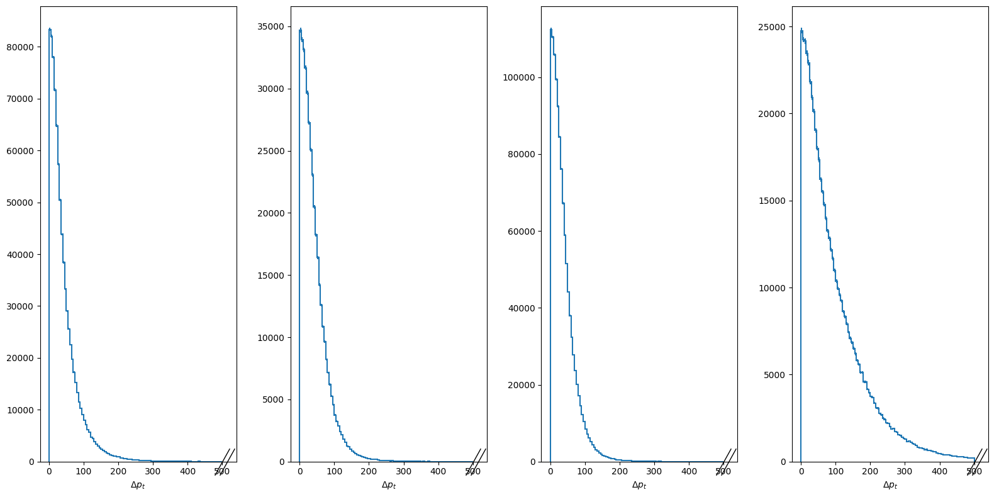

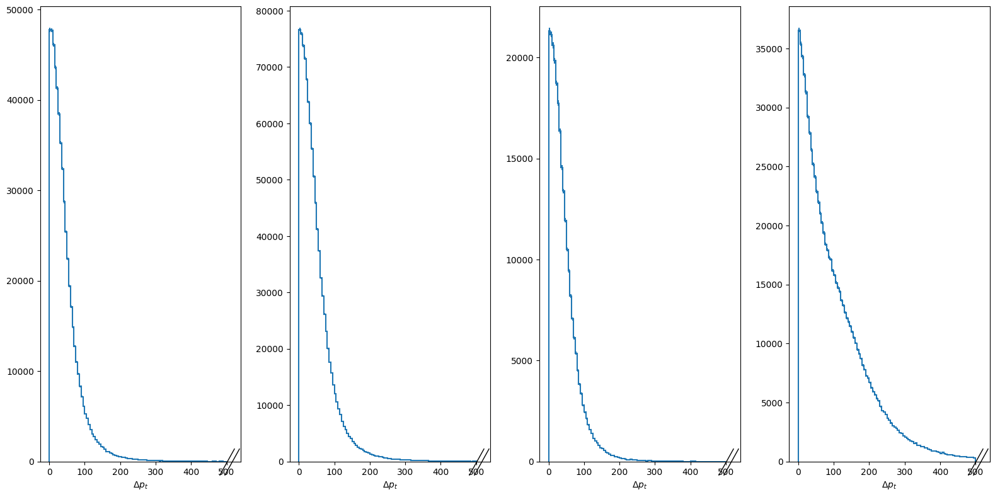

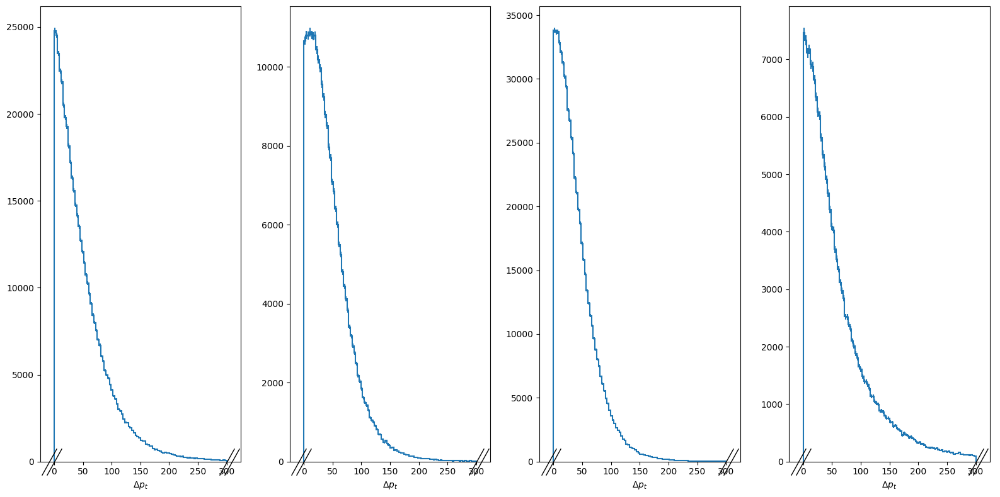

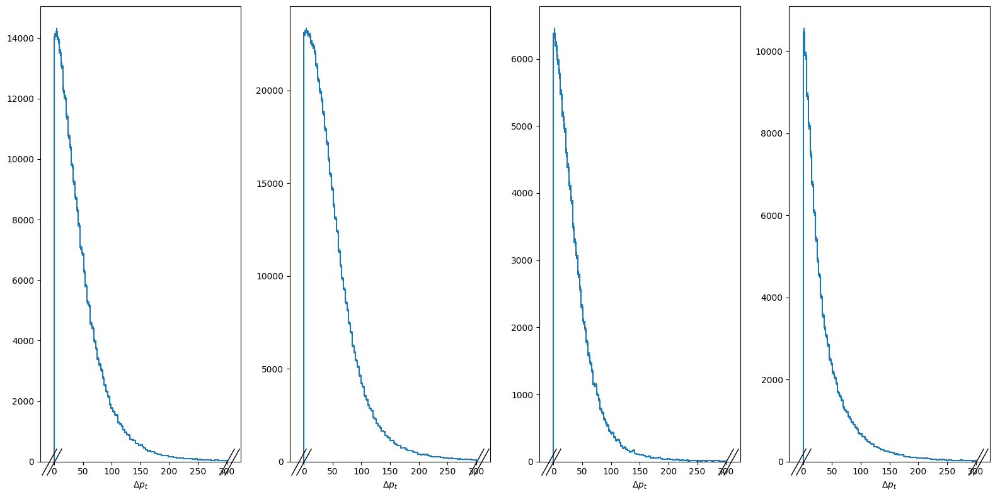

In [17]:
higgs_DiffPt = np.abs(higgsCorrect.pt - higgs.pt)
thad_DiffPt = np.abs(thadCorrect.pt - thad.pt)
tlep_DiffPt = np.abs(tlepCorrect.pt - tlep.pt)
glISR_DiffPt = np.abs(glISRCorrect.pt - glISR.pt)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='21.png',
                 start1=0, stop1=500, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='22.png',
                 start1=0, stop1=500, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffPt = higgsCorrect.pt - higgs.pt
thad_DiffPt = thadCorrect.pt - thad.pt
tlep_DiffPt = tlepCorrect.pt - tlep.pt
glISR_DiffPt = glISRCorrect.pt - glISR.pt

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='23.png',
                 start1=0, stop1=300, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPt, thad_var1=thad_DiffPt,
                 tlep_var1=tlep_DiffPt, ISR_var1=glISR_DiffPt,
                 name1='$\Delta p_t$', nameFig='24.png',
                 start1=0, stop1=300, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is installed. Otherwise errors will be set to ``sqrt(w2)``.
  self.errors()
/work/adpetre/miniconda3/envs/dizertatie/lib/python3.11/site-packages/mplhep/utils.py:271: UserWarning: Integer weights indicate poissonian data. Will calculate Garwood interval if ``scipy`` is insta

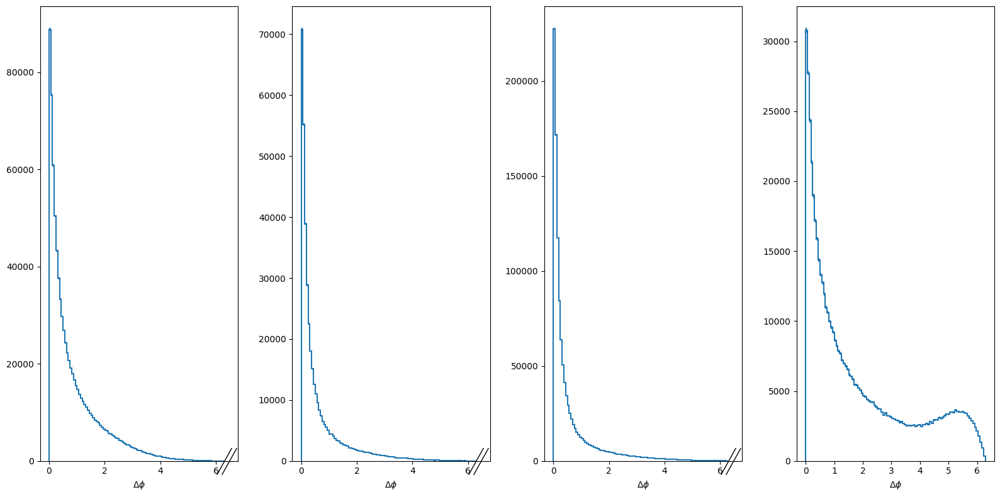

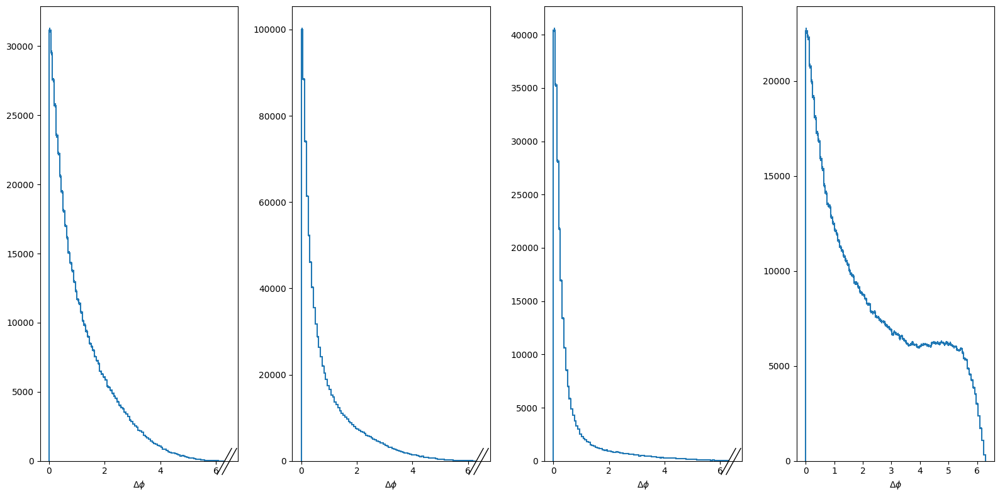

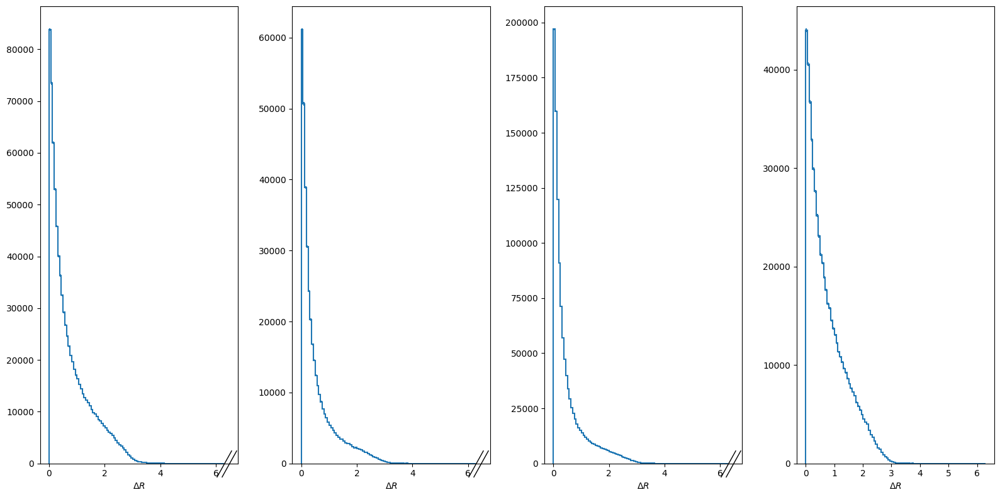

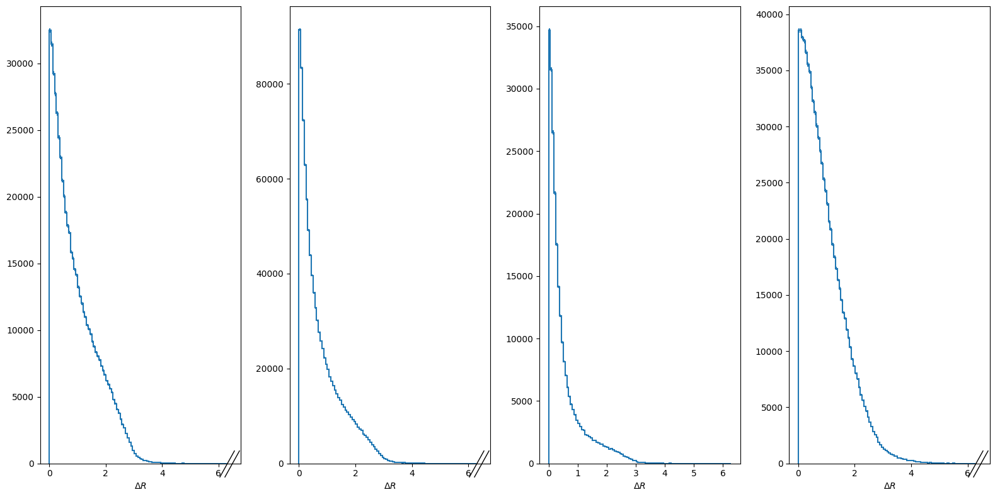

In [18]:
higgs_DiffPhi = np.abs(higgsCorrect.phi - higgs.phi)
thad_DiffPhi = np.abs(thadCorrect.phi - thad.phi)
tlep_DiffPhi = np.abs(tlepCorrect.phi - tlep.phi)
glISR_DiffPhi = np.abs(glISRCorrect.phi - glISR.phi)

plots.plot_var1d(higgs_var1=higgs_DiffPhi, thad_var1=thad_DiffPhi,
                 tlep_var1=tlep_DiffPhi, ISR_var1=glISR_DiffPhi,
                 name1='$\Delta \phi$', nameFig='25.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffPhi, thad_var1=thad_DiffPhi,
                 tlep_var1=tlep_DiffPhi, ISR_var1=glISR_DiffPhi,
                 name1='$\Delta \phi$', nameFig='26.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

higgs_DiffR = np.abs(np.sqrt(higgs.phi**2 + higgs.eta**2) -  np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2))
thad_DiffR = np.abs(np.sqrt(thad.phi**2 + thad.eta**2) -  np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2))
tlep_DiffR = np.abs(np.sqrt(tlep.phi**2 + tlep.eta**2) -  np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2))
glISR_DiffR = np.abs(np.sqrt(glISR.phi**2 + glISR.eta**2) -  np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2))

plots.plot_var1d(higgs_var1=higgs_DiffR, thad_var1=thad_DiffR,
                 tlep_var1=tlep_DiffR, ISR_var1=glISR_DiffR,
                 name1='$\Delta R$', nameFig='27.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=False, log=False)

plots.plot_var1d(higgs_var1=higgs_DiffR, thad_var1=thad_DiffR,
                 tlep_var1=tlep_DiffR, ISR_var1=glISR_DiffR,
                 name1='$\Delta R$', nameFig='28.png',
                 start1=0, stop1=2*pi, bins1=100,
                 higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
                 neg_Mask=True, log=False)

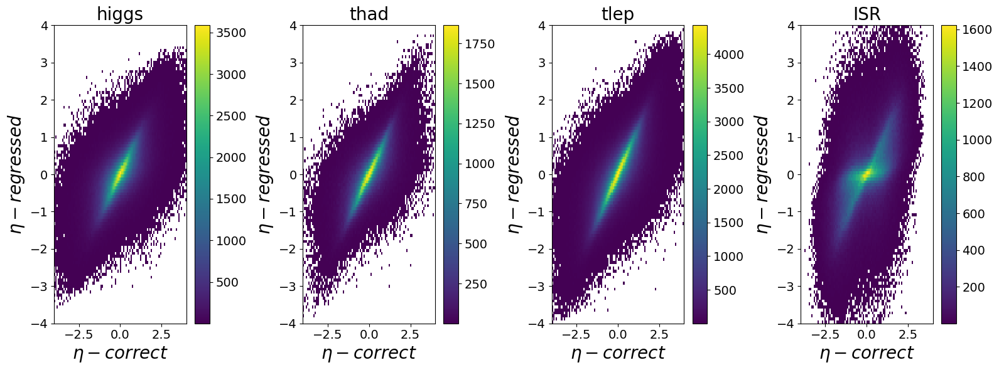

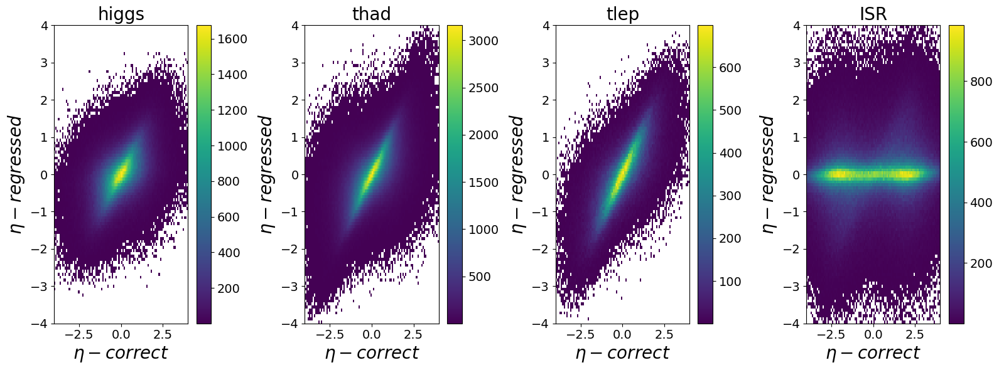

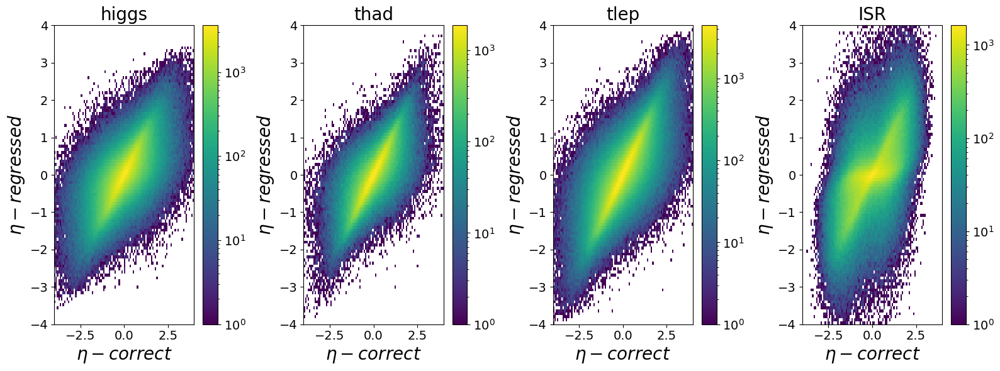

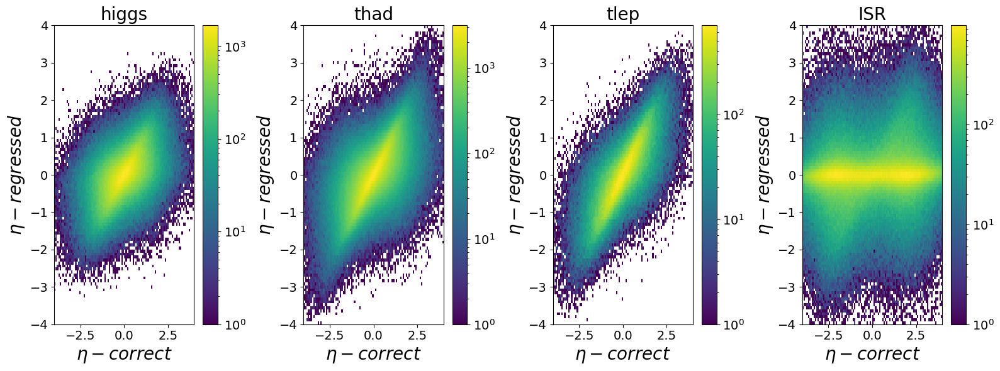

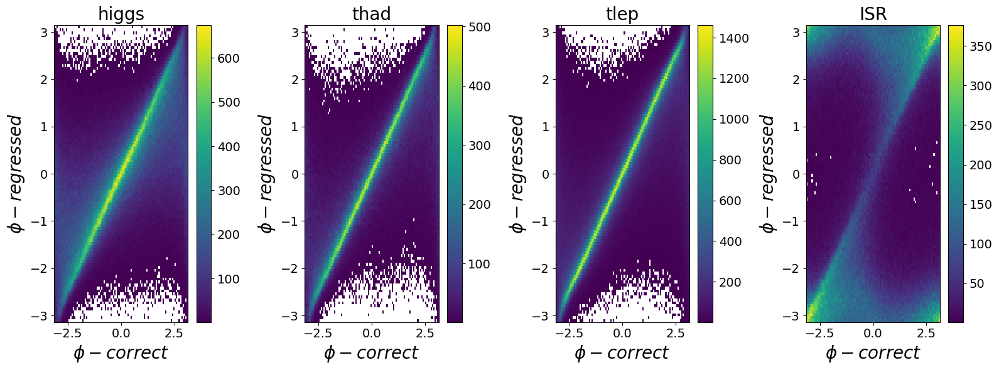

...

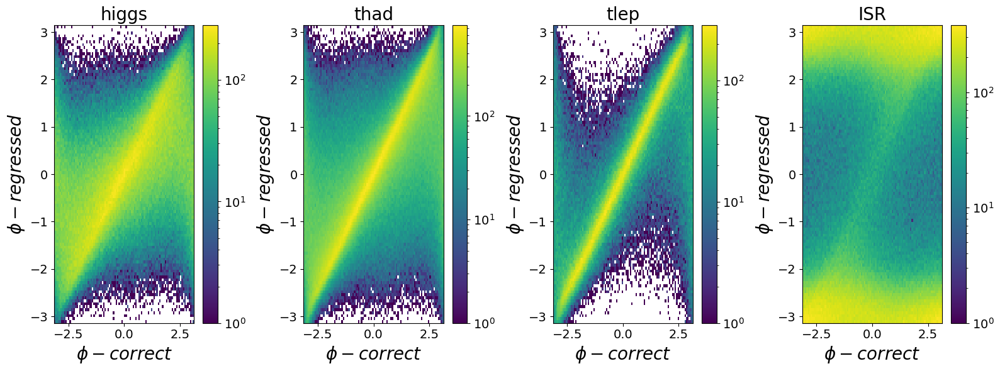

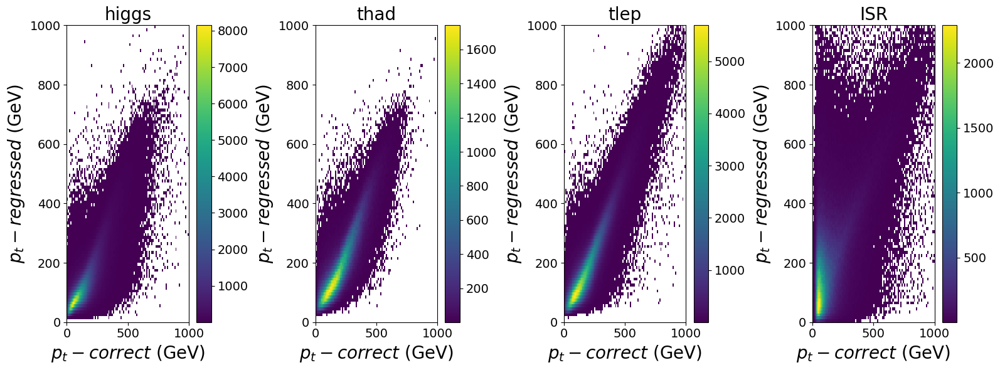

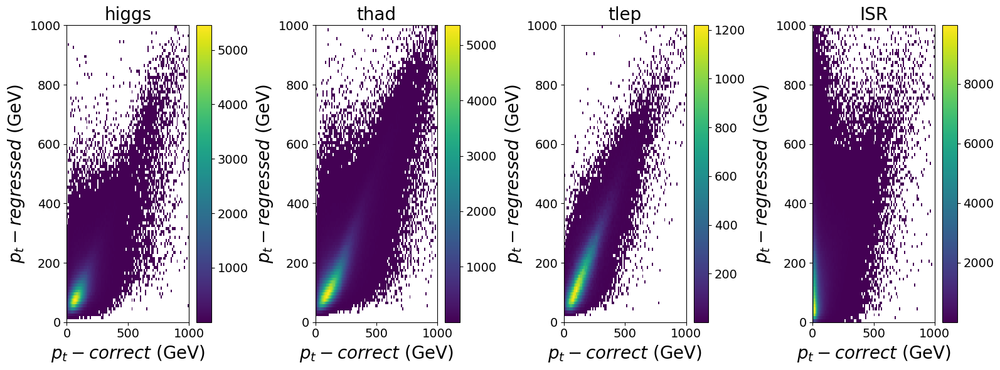

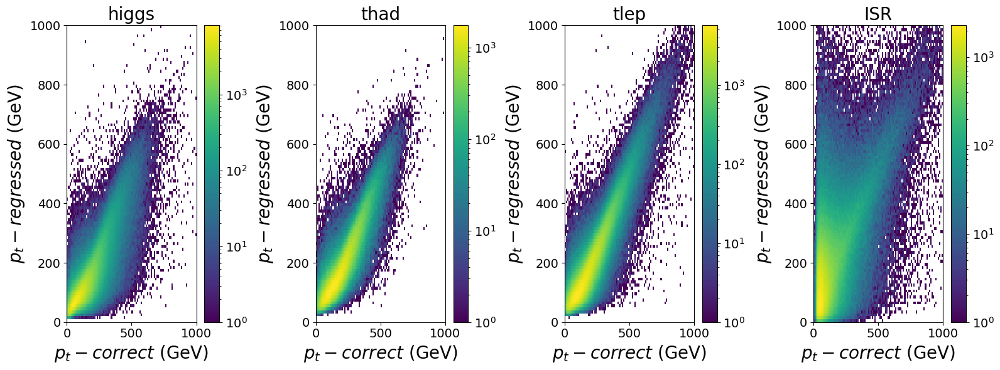

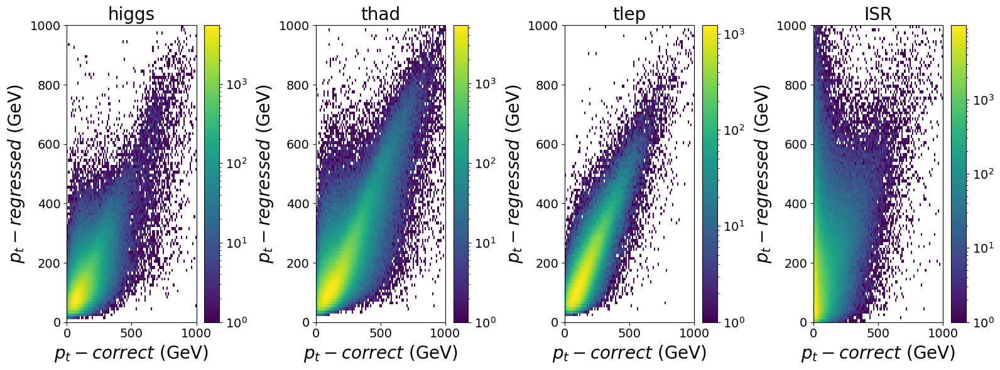

In [21]:
#eta
plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='29.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='30.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='31.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs.eta,
           thad_var1=thadCorrect.eta, thad_var2=thad.eta,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep.eta,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR.eta,
           name1='$\eta-correct$', name2='$\eta-regressed$', nameFig='32.png', 
           start1=-4, stop1=4, start2=-4, stop2=4, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')


# phi
plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='33.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='34.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='35.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorrect.phi, higgs_var2=higgs.phi,
           thad_var1=thadCorrect.phi, thad_var2=thad.phi,
           tlep_var1=tlepCorrect.phi, tlep_var2=tlep.phi,
           ISR_var1=glISRCorrect.phi, ISR_var2=glISR.phi,
           name1='$\phi-correct$', name2='$\phi-regressed$', nameFig='36.png', 
           start1=-pi, stop1=pi, start2=-pi, stop2=pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')

# pt
plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='37.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='38.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='39.png', 
           start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='(GeV)')

plots.plot_var2d(higgs_var1=higgsCorrect.pt, higgs_var2=higgs.pt,
           thad_var1=thadCorrect.pt, thad_var2=thad.pt,
           tlep_var1=tlepCorrect.pt, tlep_var2=tlep.pt,
           ISR_var1=glISRCorrect.pt, ISR_var2=glISR.pt,
           name1='$p_t-correct$', name2='$p_t-regressed$', nameFig='40.png', 
          start1=0, stop1=1000, start2=0, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='(GeV)')

In [131]:
# R
higgsCorR = np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2)
higgsR = np.sqrt(higgs.phi**2 + higgs.eta**2)

thadCorR = np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2)
thadR = np.sqrt(thad.phi**2 + thad.eta**2)

tlepCorR = np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2)
tlepR = np.sqrt(tlep.phi**2 + tlep.eta**2)

ISRCor_R = np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2)
ISR_R = np.sqrt(glISR.phi**2 + glISR.eta**2)

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='41.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='42.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='43.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True, nameunit='')

plots.plot_var2d(higgs_var1=higgsCorR, higgs_var2=higgsR,
           thad_var1=thadCorR, thad_var2=thadR,
           tlep_var1=tlepCorR, tlep_var2=tlepR,
           ISR_var1=ISRCor_R, ISR_var2=ISR_R,
           name1='$R-correct$', name2='$R-regressed$', nameFig='44.png', 
           start1=0, stop1=6, start2=0, stop2=6, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True, nameunit='')


# eta vs DiffPt
higgs_DiffPt = higgsCorrect.pt - higgs.pt
thad_DiffPt = thadCorrect.pt - thad.pt
tlep_DiffPt = tlepCorrect.pt - tlep.pt
glISR_DiffPt = glISRCorrect.pt - glISR.pt

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='45.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='46.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='47.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPt,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPt,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPt,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPt,
           name1='$\eta-correct$', name2='$\Delta p_t (GeV)$', nameFig='48.png', 
           start1=-4, stop1=4, start2=-1000, stop2=1000, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)



NameError: name 'plots' is not defined

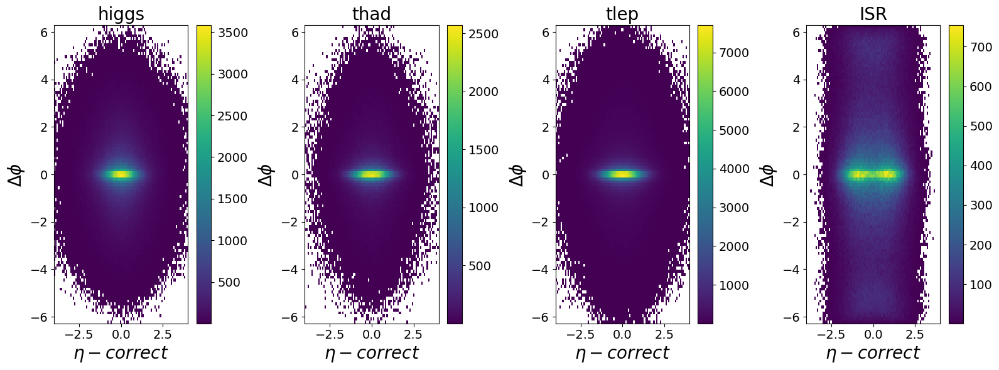

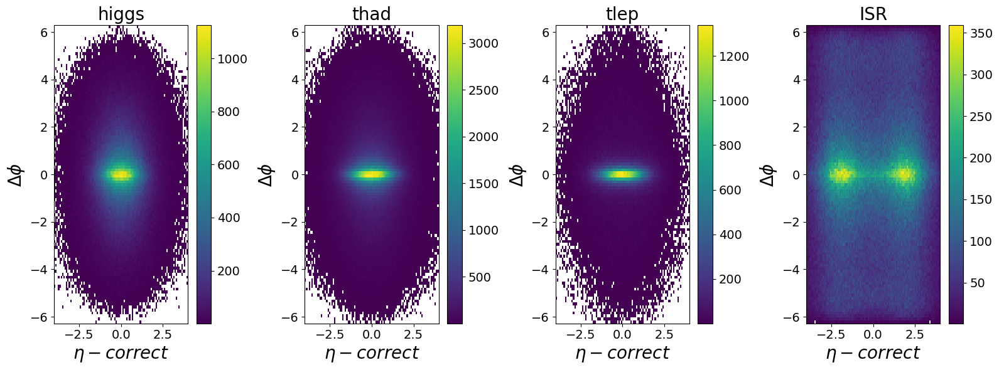

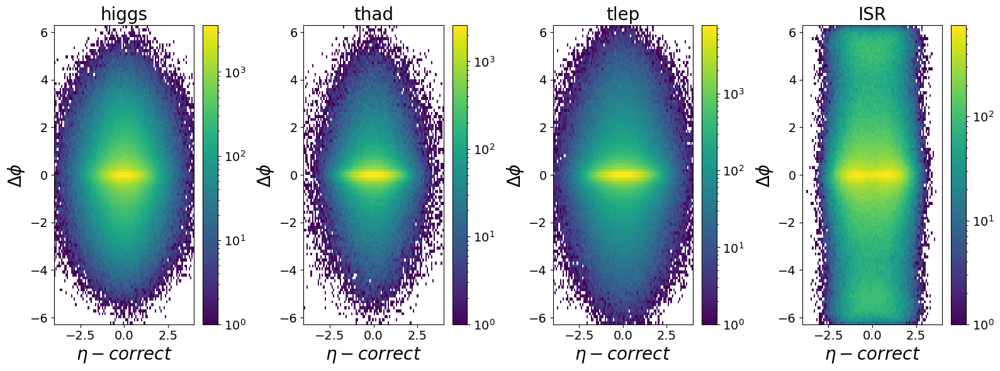

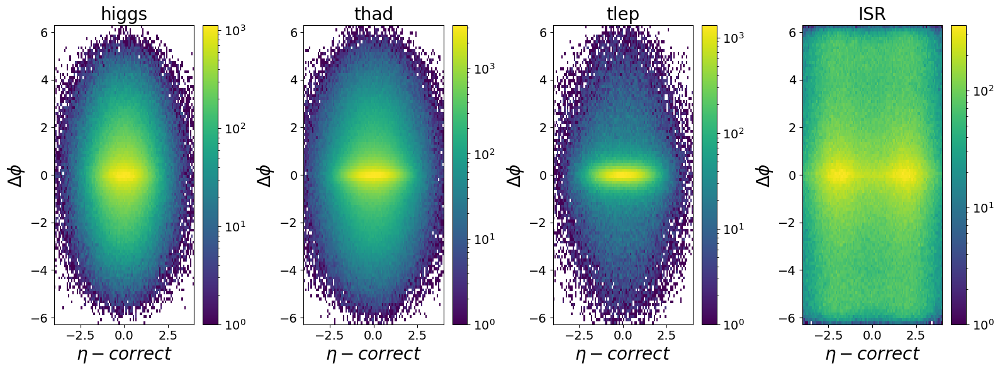

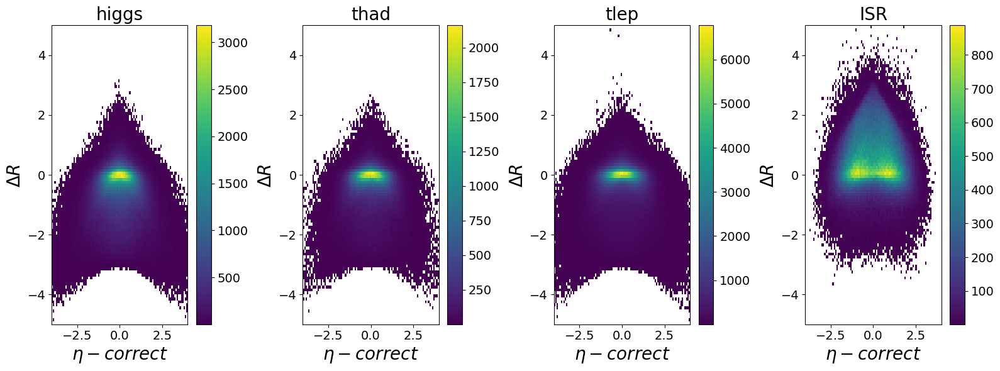

...

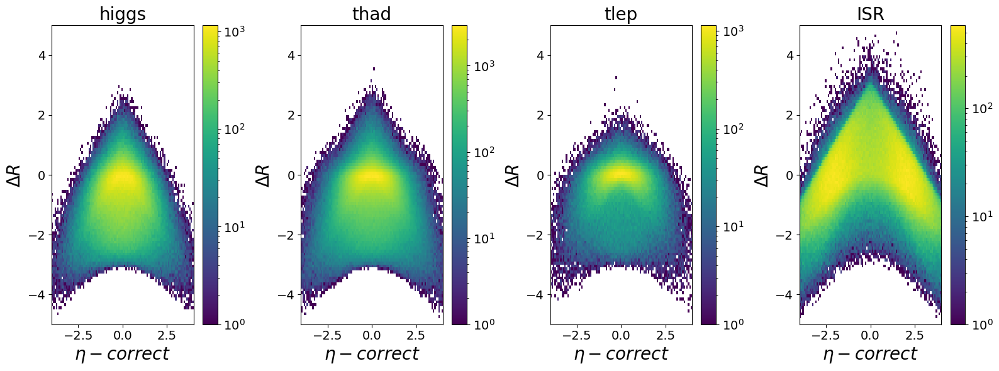

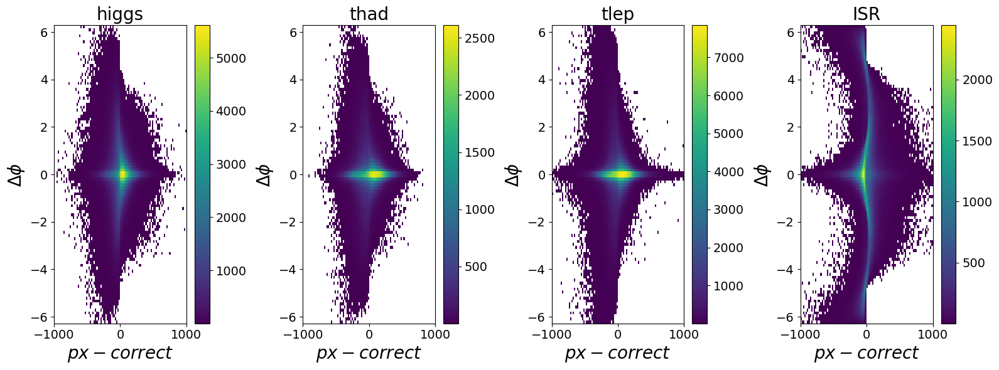

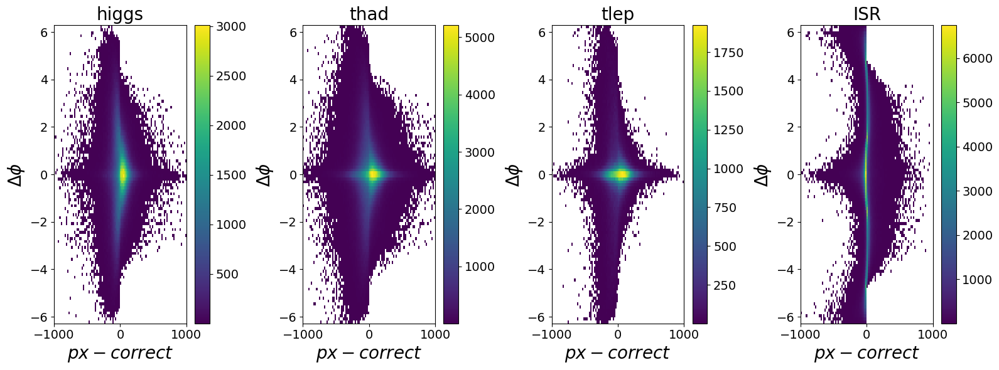

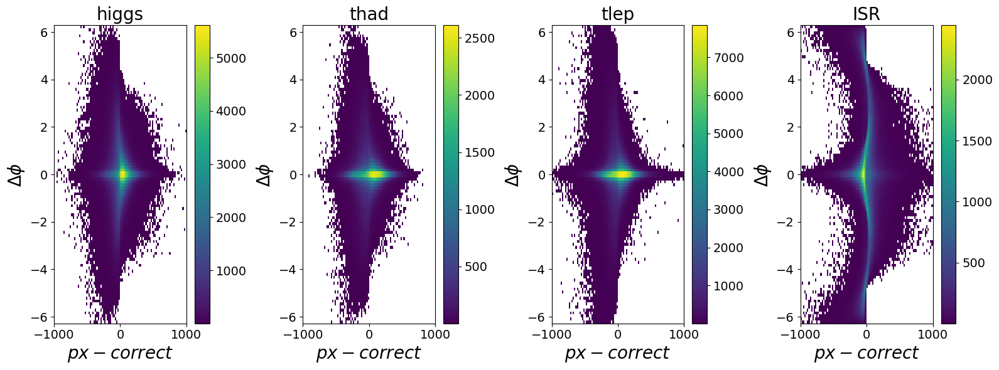

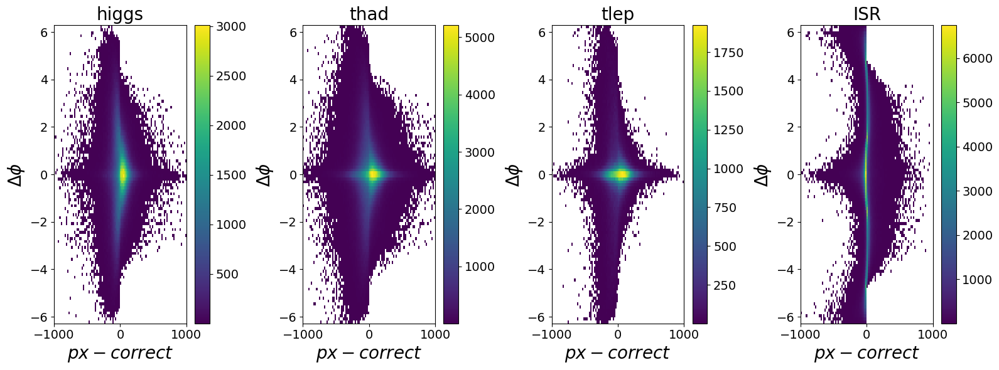

In [25]:
#eta vs diff_phi
higgs_DiffPhi = higgsCorrect.phi - higgs.phi
thad_DiffPhi = thadCorrect.phi - thad.phi
tlep_DiffPhi = tlepCorrect.phi - tlep.phi
glISR_DiffPhi = glISRCorrect.phi - glISR.phi

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='49.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='50.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='51.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffPhi,
           name1='$\eta-correct$', name2='$\Delta \phi$', nameFig='52.png', 
           start1=-4, stop1=4, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)

# eta vs Diff_R
higgs_DiffR = np.sqrt(higgs.phi**2 + higgs.eta**2) -  np.sqrt(higgsCorrect.phi**2 + higgsCorrect.eta**2)
thad_DiffR = np.sqrt(thad.phi**2 + thad.eta**2) -  np.sqrt(thadCorrect.phi**2 + thadCorrect.eta**2)
tlep_DiffR = np.sqrt(tlep.phi**2 + tlep.eta**2) -  np.sqrt(tlepCorrect.phi**2 + tlepCorrect.eta**2)
glISR_DiffR = np.sqrt(glISR.phi**2 + glISR.eta**2) -  np.sqrt(glISRCorrect.phi**2 + glISRCorrect.eta**2)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='53.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='54.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='55.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=True)

plots.plot_var2d(higgs_var1=higgsCorrect.eta, higgs_var2=higgs_DiffR,
           thad_var1=thadCorrect.eta, thad_var2=thad_DiffR,
           tlep_var1=tlepCorrect.eta, tlep_var2=tlep_DiffR,
           ISR_var1=glISRCorrect.eta, ISR_var2=glISR_DiffR,
           name1='$\eta-correct$', name2='$\Delta R$', nameFig='56.png', 
           start1=-4, stop1=4, start2=-5, stop2=5, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=True)

#px vs diff_phi

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='57.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='58.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='59.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=False, log=False)

plots.plot_var2d(higgs_var1=higgsCorrect.px, higgs_var2=higgs_DiffPhi,
           thad_var1=thadCorrect.px, thad_var2=thad_DiffPhi,
           tlep_var1=tlepCorrect.px, tlep_var2=tlep_DiffPhi,
           ISR_var1=glISRCorrect.px, ISR_var2=glISR_DiffPhi,
           name1='$px-correct$', name2='$\Delta \phi$', nameFig='60.png', 
           start1=-1000, stop1=1000, start2=-2*pi, stop2=2*pi, bins1=100, bins2=100,
           higgs_mask=higgs_mask, thad_mask=thad_mask, tlep_mask=tlep_mask, ISR_mask=ISR_mask,
           neg_Mask=True, log=False)

# Rambo

In [19]:
data_phasespace = data.parton_data.phasespace_intermediateParticles
data_phasespaceDet = data.parton_data.phasespace_rambo_detjacobian
data_boostReco = data.reco_data.data_boost.squeeze(axis=1)

E_CM = 13000
phasespace = PhaseSpace(E_CM, [21, 21], [25, 6, -6, 21], dev="cpu")

# Using Boost from reco data

In [20]:
x1 = (data_boostReco[:, 0] + data_boostReco[:, 3]) / E_CM
x2 = (data_boostReco[:, 0] - data_boostReco[:, 3]) / E_CM
    
ps_regressed, detjinv_regressed = phasespace.get_ps_from_momenta(new_data_regressed, x1, x2, ensure_CM=True)
ps_regressed = torch.nan_to_num(ps_regressed, nan=-0.03)

In [21]:
print(ps_regressed.shape)

torch.Size([1414130, 10])


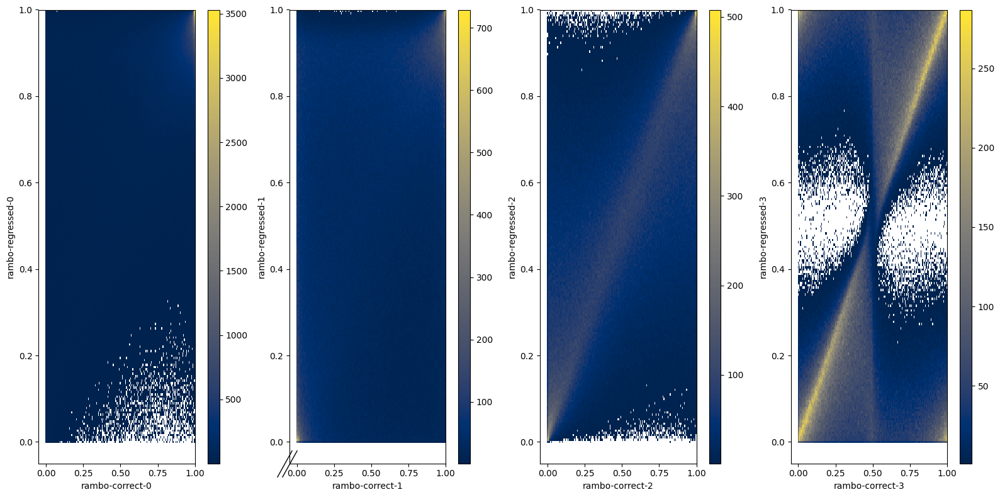

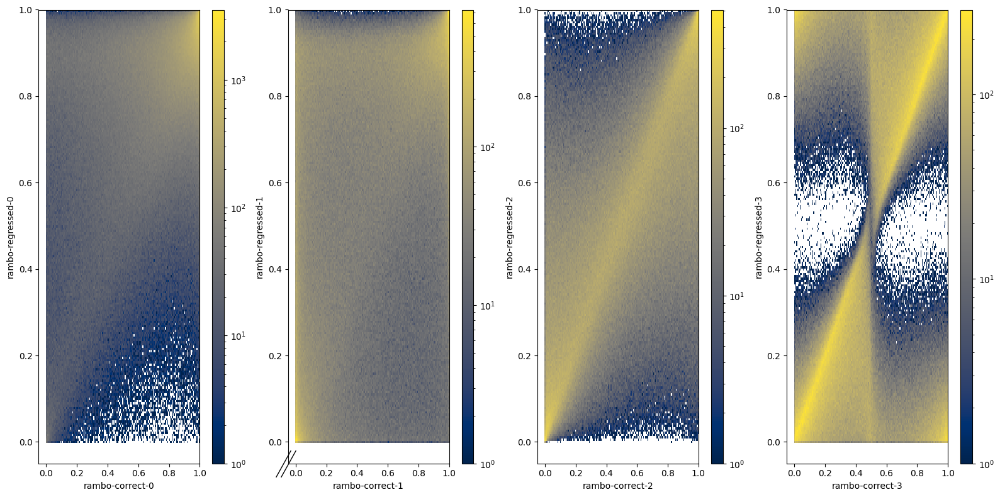

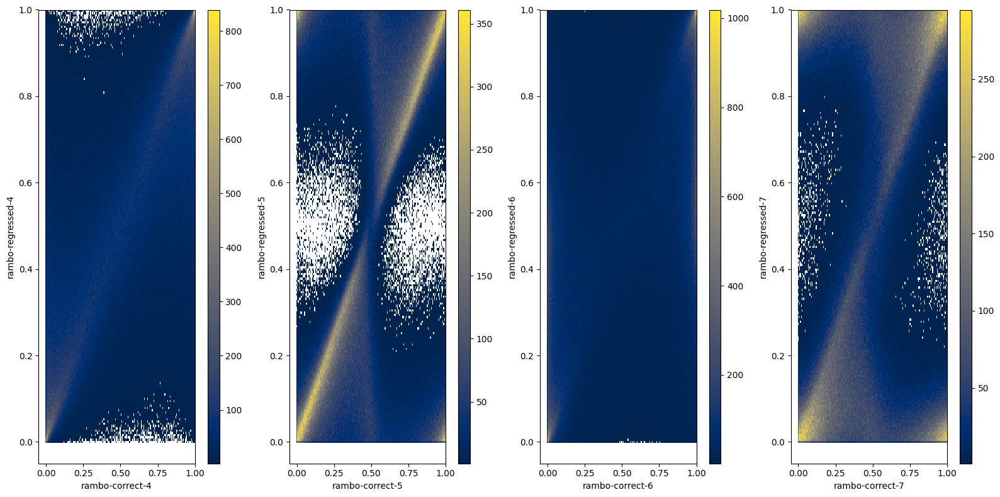

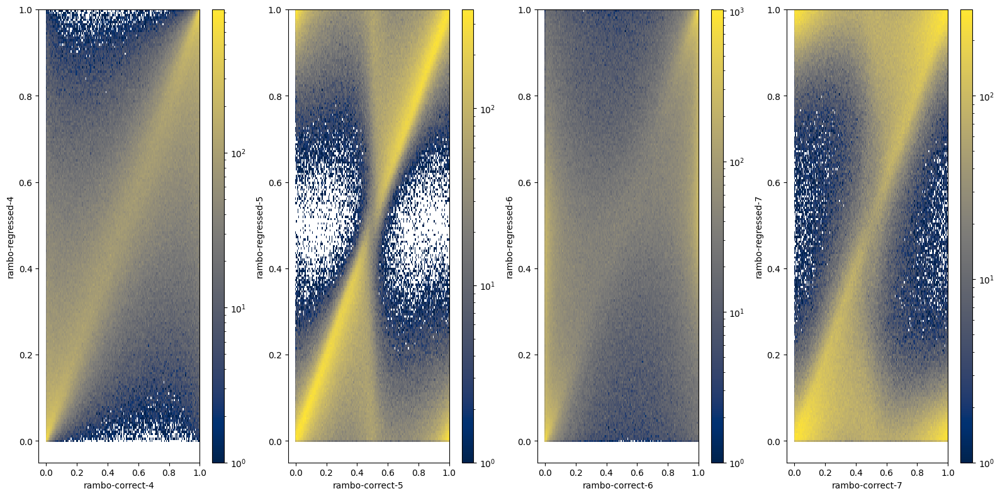

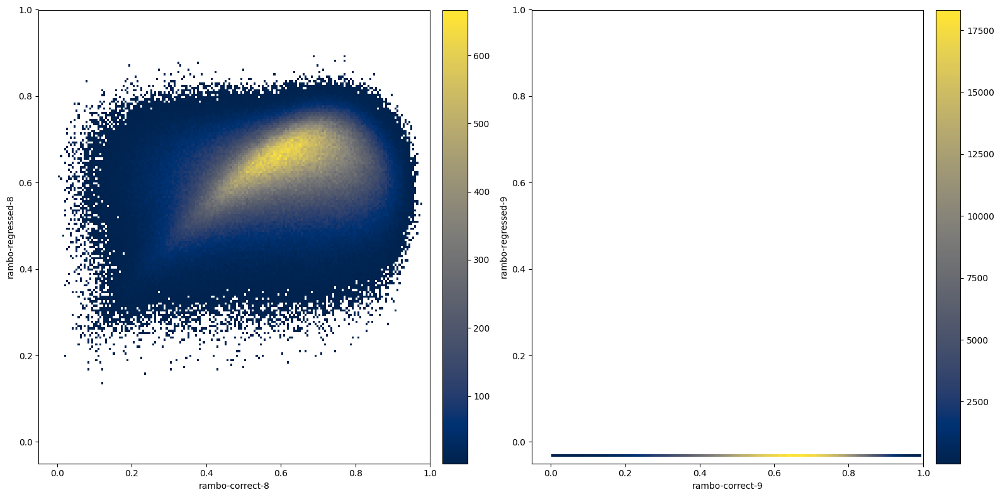

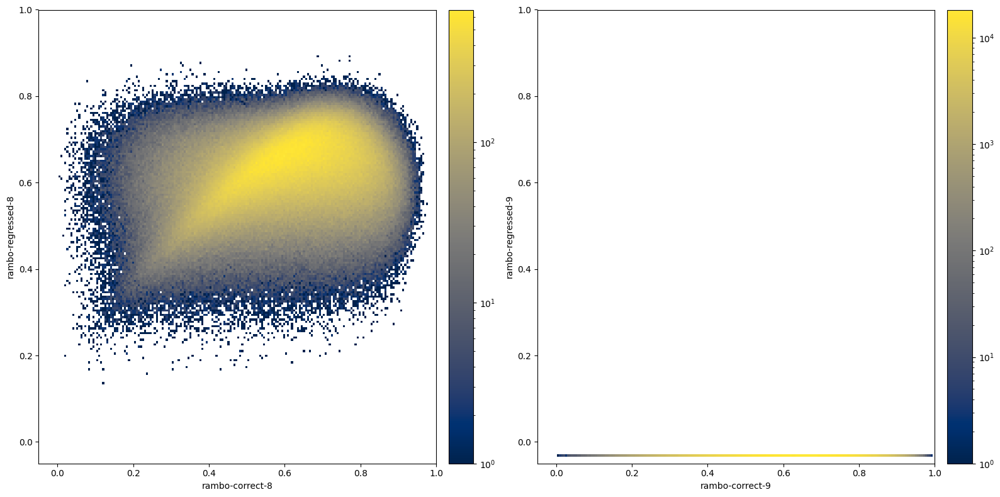

In [22]:
for i in range(3):
        numberFig = 61+2*i
        plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig}.png', typePlot=i, log=False)
        
        plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig+1}.png', typePlot=i, log=True)

# Using Boost from regressed data

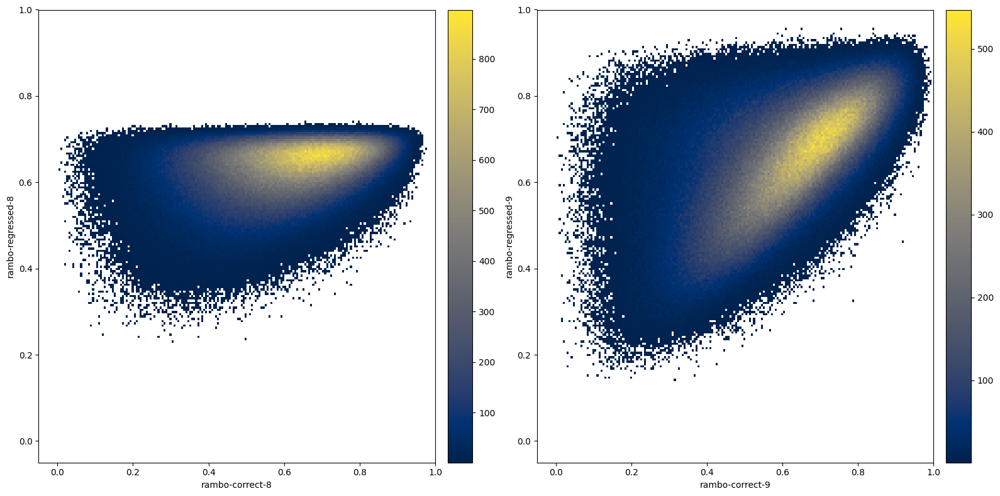

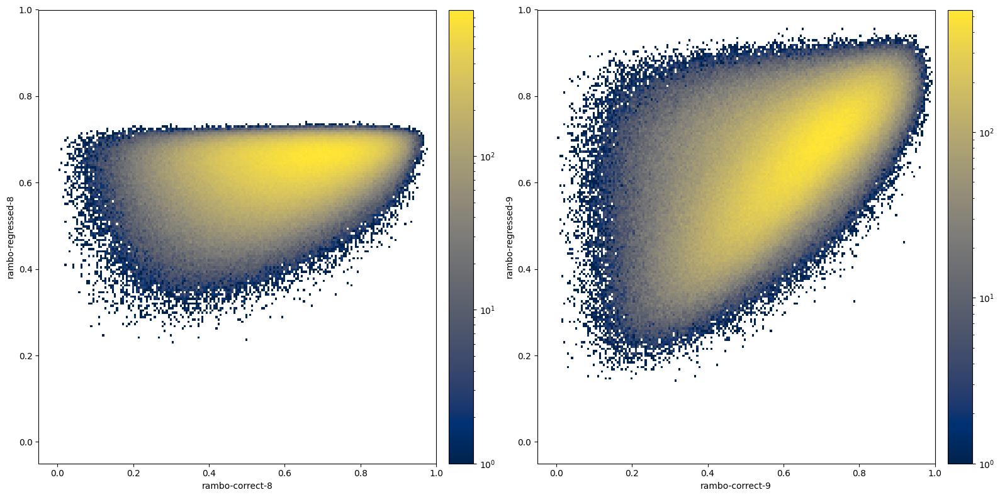

In [23]:
x1 = (boost_regressed[:, 0] + boost_regressed[:, 3]) / E_CM
x2 = (boost_regressed[:, 0] - boost_regressed[:, 3]) / E_CM
    
ps_regressed, detjinv_regressed = phasespace.get_ps_from_momenta(new_data_regressed, x1, x2, ensure_CM=True)
ps_regressed = torch.nan_to_num(ps_regressed, nan=-0.03)

numberFig = 67
# Here compute only x1/x2 (rest of plots look the same as above)
plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig}.png', typePlot=2, log=False)
        
plots.plot_rambo(data_phasespace.detach().numpy(), ps_regressed.detach().numpy(),
                         nameFig=f'{numberFig+1}.png', typePlot=2, log=True)